In [1]:
from maxentnuc.analysis.analysis_orca import *
from neighbor_balance.plotting import apply_matplotlib_style

data_root = '/orcd/home/002/joepaggi/orcd/pool'

apply_matplotlib_style()

No data root found, set manually.


In [2]:
chrom, start, end = 'chr3', 33_914_000, 35_594_000  # full RCMC region
orca = read_sox2_orca(data_root='/home/joepaggi/orcd/pool/omics', wt_only=True)

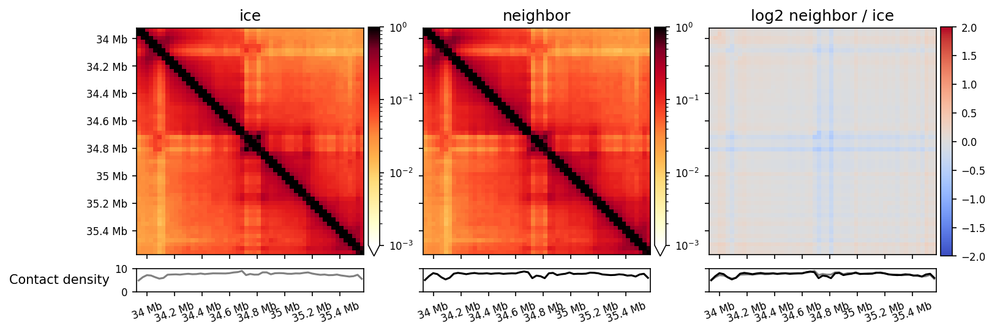

In [3]:
regions = orca['wt'].select_region(start, end).regions
# The regions are each 30_001 bp long which creates problems with the coarse-graining...
regions = [(round(s / 100.0) * 100, round(e / 100.0) * 100) for s, e in regions]
ice_contact_map, neighbor_contact_map = load_contact_maps('region_contact_maps/WT_merged/sox2.npz', regions)

neighbor_contact_map.compare(ice_contact_map, 'neighbor', 'ice', density_max=10)
plt.show()

In [4]:
# Load simulation data.
mei_runs = '/orcd/data/binz/001/joepaggi/mei_runs'
conditions = {
    'simulation': {'base': f'{mei_runs}/sox2/v11/013', 'scale':0.1},

    # 'v17': {'base': f'{mei_runs}/sox2/v11/017', 'scale':0.1},
    # 'v18': {'base': f'{mei_runs}/sox2/v11/018', 'scale':0.1},
    # 'v19': {'base': f'{mei_runs}/sox2/v11/019', 'scale':0.1},
}
conditions = expand_conditions(conditions)

track = orca['wt'].select_region(start, end)
simulation = load_simulations(track.regions, conditions, chrom, start, end, skip=11)

simulation


/home/joepaggi/miniconda3/envs/neighbor/lib/python3.12/site-packages/MDAnalysis/coordinates/DCD.py:165: DeprecationWarning: DCDReader currently makes independent timesteps by copying self.ts while other readers update self.ts inplace. This behavior will be changed in 3.0 to be the same as other readers. Read more at https://github.com/MDAnalysis/mdanalysis/issues/3889 to learn if this change in behavior might affect you.
  warnings.warn("DCDReader currently makes independent timesteps"
/home/joepaggi/miniconda3/envs/neighbor/lib/python3.12/site-packages/MDAnalysis/coordinates/DCD.py:326: DeprecationWarning: asel argument to timeseries will be renamed to'atomgroup' in 3.0, see #3911
  warnings.warn(


# ORCA full regions

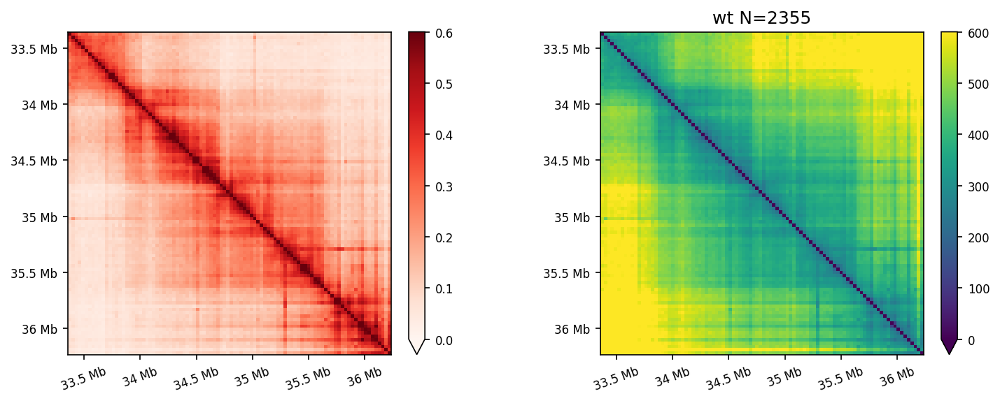

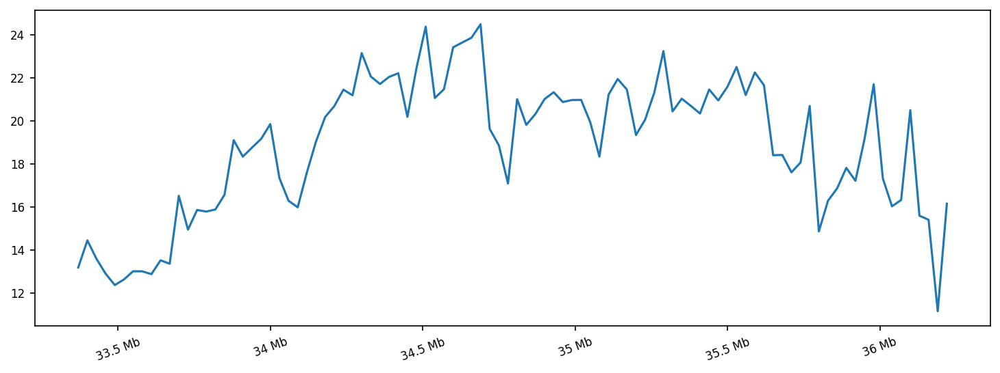

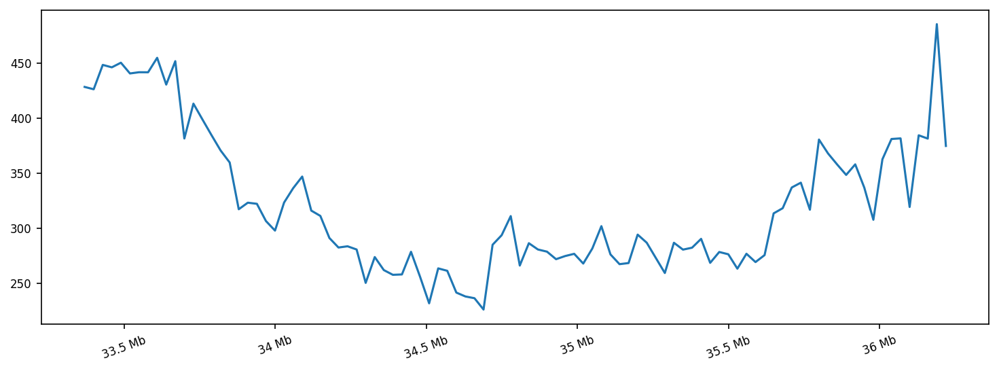

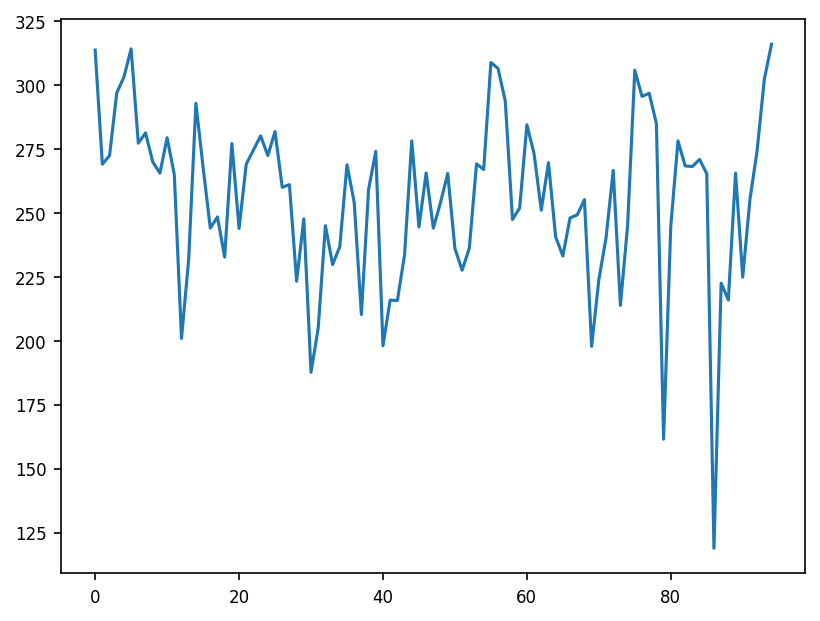

366.0401939687335 254.0571135147007


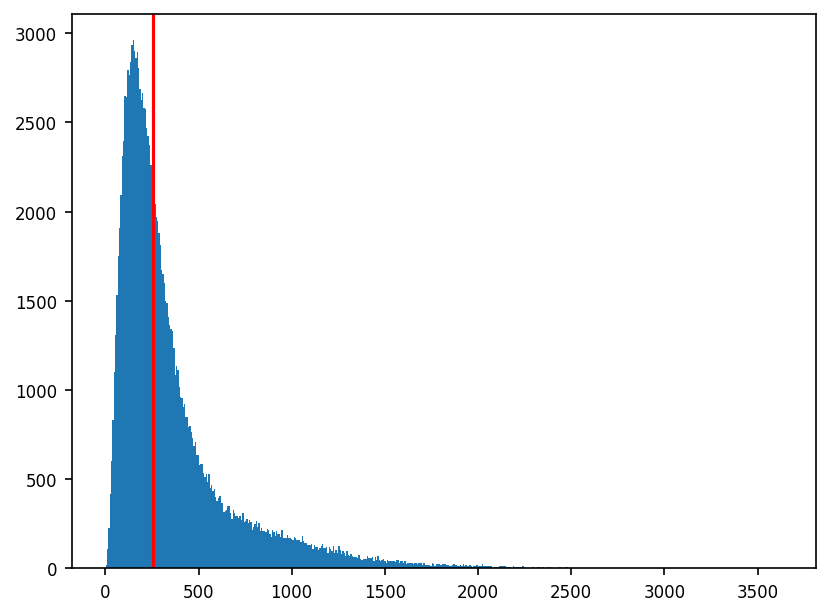

In [5]:
for name, thresh in [('wt', 250)]: #, ('ctcf_nt', 256), ('rad21_nt', 256), ('rad21_auxin', 256)]:
    _orca = {k:v for k, v in orca.items() if name in k}
    map_start, map_end = TrackData.get_intersection(list(_orca.values()))
    _orca = {k: v.select_region(map_start, map_end) for k, v in _orca.items()}
    _orca = TrackData.join(list(_orca.values()))

    contacts = positions_to_contacts(_orca.positions, 256)
    distances = positions_to_average_distance(_orca.positions)

    f, ax = plt.subplots(1, 2, figsize=(12, 4))
    plot_pairwise(contacts, f'{chrom}:{map_start}-{map_end}', vmin=0, vmax=0.60, cmap='Reds', ax=ax[0], log_norm=False)
    plot_pairwise(distances, f'{chrom}:{map_start}-{map_end}', vmin=0, vmax=600, cmap='viridis', ax=ax[1], log_norm=False)
    plt.title(f'{name} N={len(_orca.positions)}')
    plt.show()

    f, ax = plt.subplots(figsize=(12, 4))
    ax.plot(_orca.x(), np.sum(contacts, axis=0))
    format_ticks(ax, y=False)
    plt.show()

    positions = _orca.positions - np.nanmean(_orca.positions, axis=1, keepdims=True)
    radial_dists = np.linalg.norm(positions, axis=-1)
    f, ax = plt.subplots(figsize=(12, 4))
    ax.plot(_orca.x(), np.nanmedian(radial_dists, axis=0))
    format_ticks(ax, y=False)
    plt.show()

    dists = np.linalg.norm(_orca.positions[:, 1:, :] - _orca.positions[:, :-1, :], axis=-1)
    plt.plot(np.nanmedian(dists, axis=0))
    plt.show()

    plt.hist(dists.flatten(), bins=500)
    plt.axvline(np.nanmedian(dists), color='red')
    print(np.nanmean(dists), np.nanmedian(dists))
    plt.show()

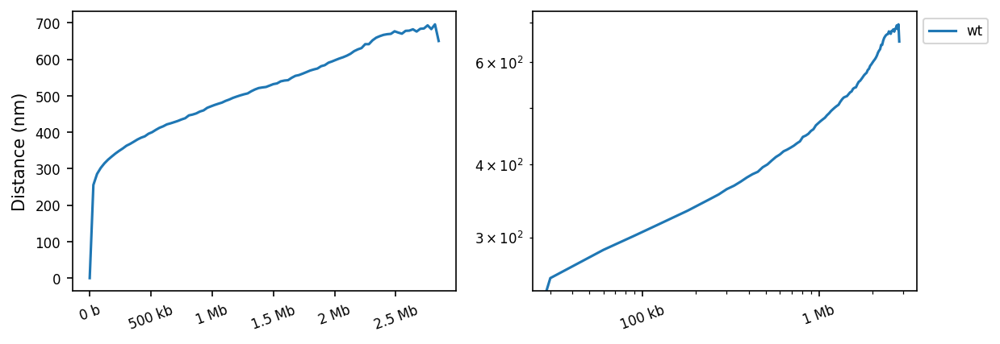

In [6]:
f, ax = plt.subplots(1, 2, figsize=(9, 3))
cut=3
for name, track in orca.items():
    #track = track.select_region(start, end)
    plot_distance_scaling(ax, name, track, cut=cut, scatter=False)
ax[1].legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.show()

# Estimate measurement noise

In [7]:
nanog_chrom, nanog_start, nanog_end = 'chr6', 122455000, 122875000 # simulated region

nanog_orca = read_nanog_orca(data_root='/home/joepaggi/orcd/pool/omics')
index_imaged, index_5kb, index_15kb = nanog_index()

nanog_conditions = {
    'simulation': {'base': f'{mei_runs}/nanog/v36/018', 'scale': 1/10},
}
nanog_conditions = expand_conditions(nanog_conditions)
nanog_simulation = load_simulations(nanog_orca['rep1']['esc'].regions, nanog_conditions, nanog_chrom, nanog_start, nanog_end)

regions = list(range(nanog_start, nanog_end, 30_000))
regions = [(x, x+30000) for x in regions]
track = TrackData(nanog_chrom, regions, None)
nanog_simulation_30kb = load_simulations(track.regions, conditions, nanog_chrom, nanog_start, nanog_end)

simulation
simulation


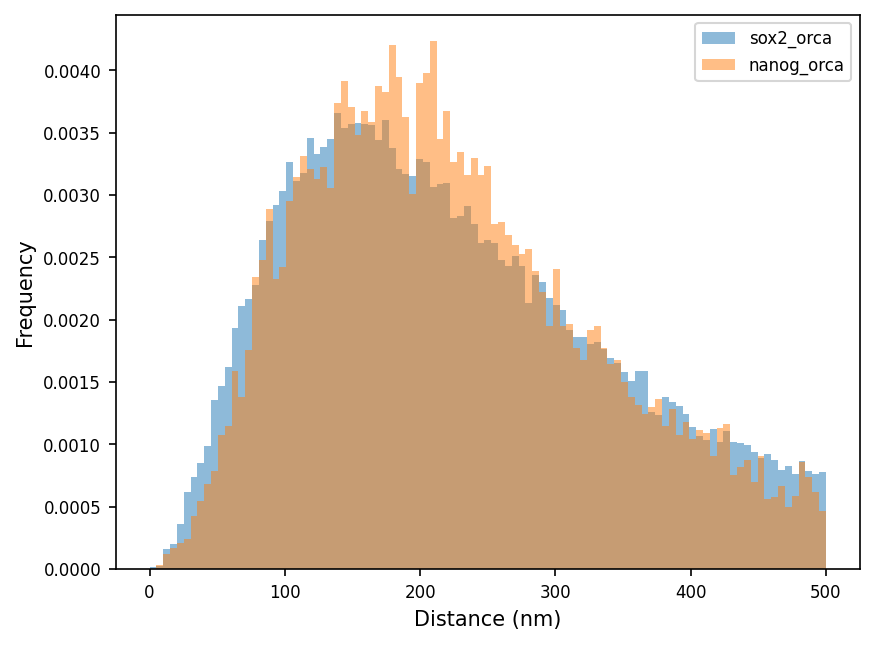

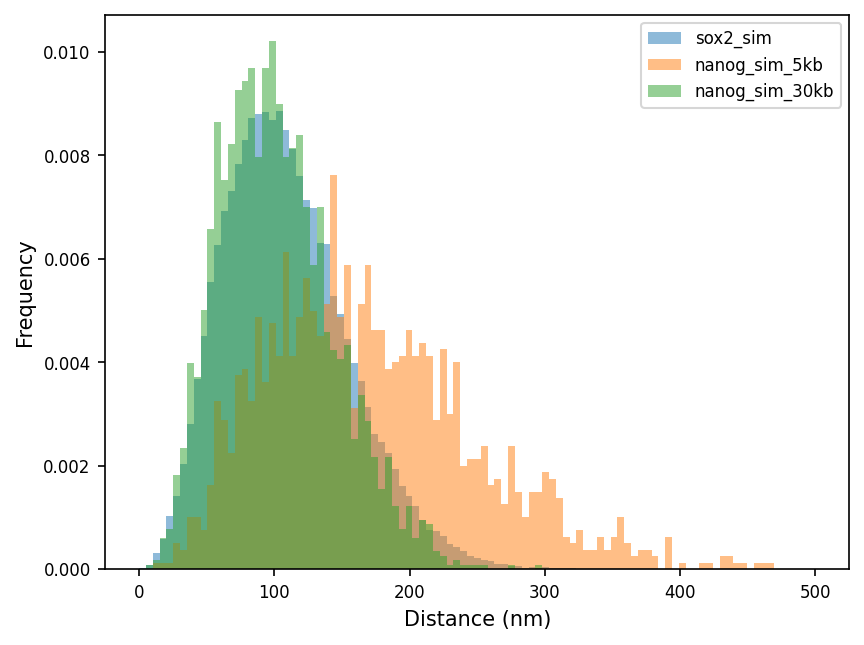

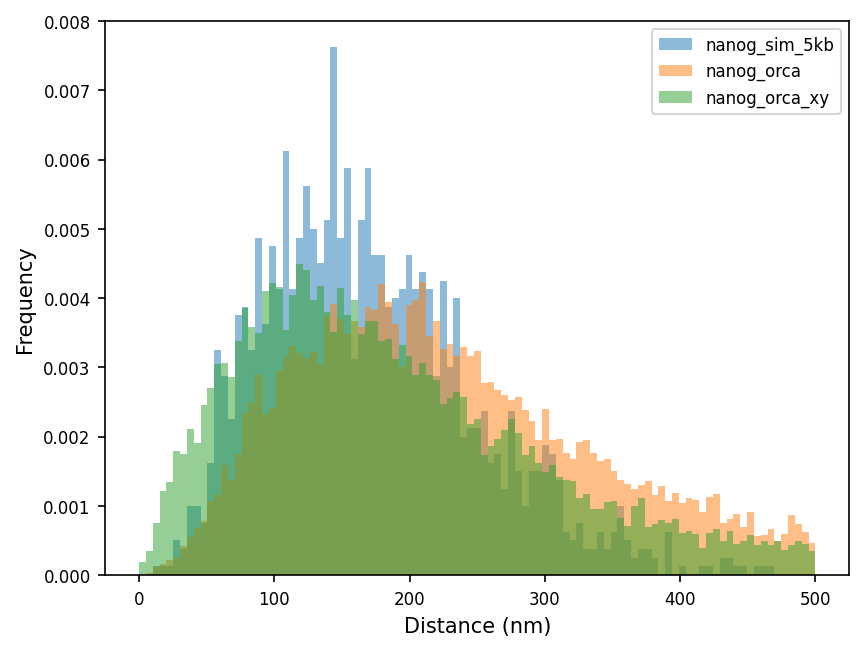

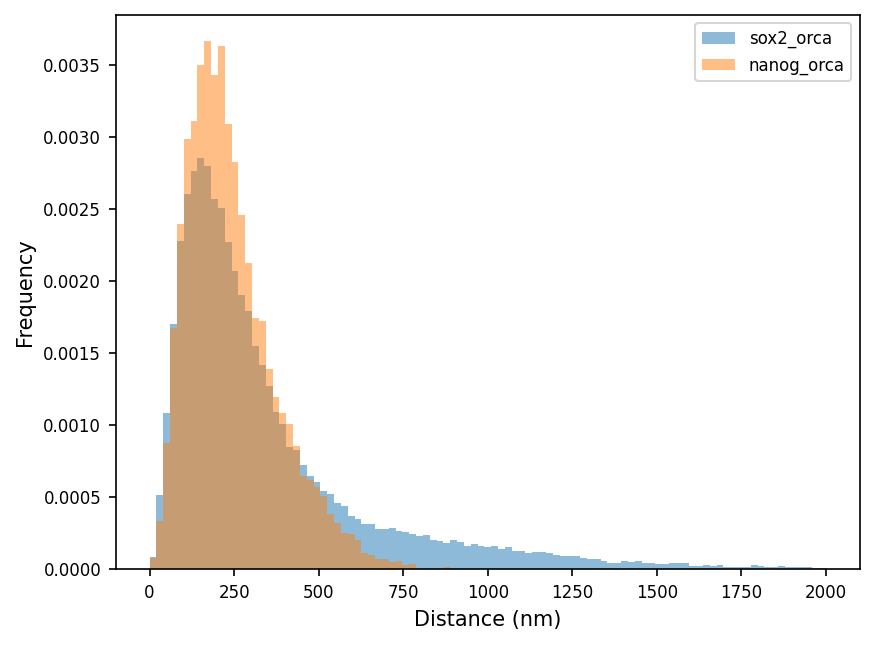

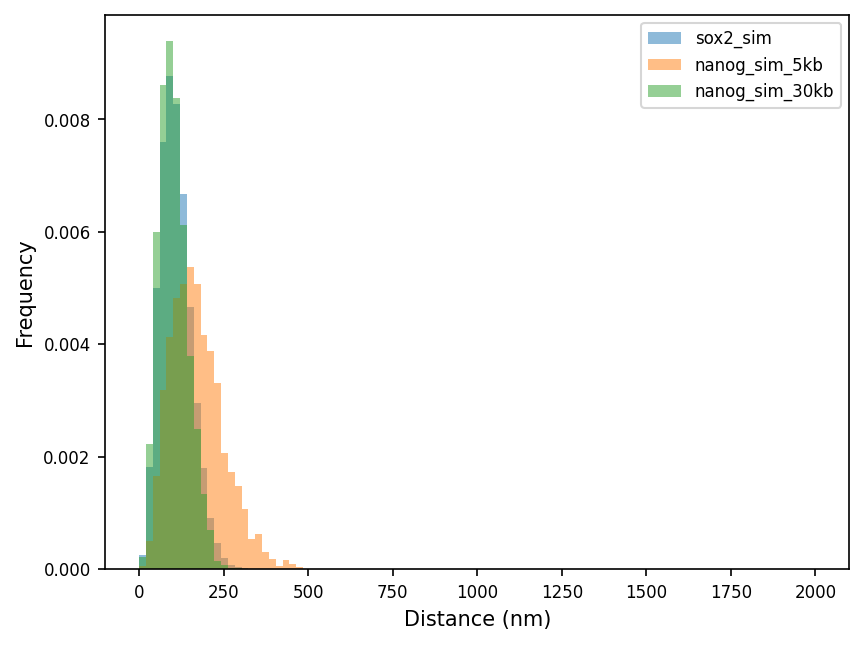

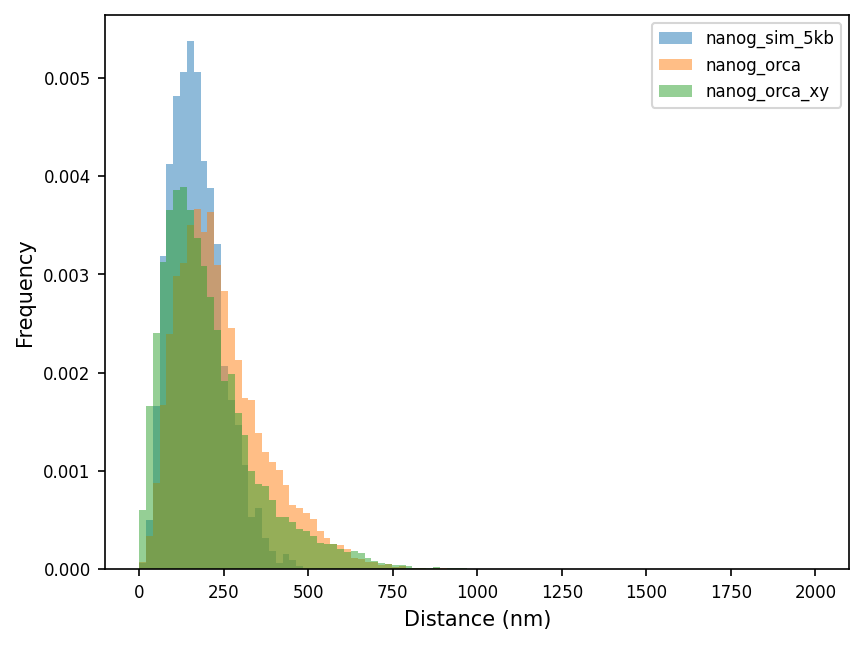

In [8]:
for high in [500, 2000]:
    bins = np.linspace(0, high, 100)

    # Compare ORCA
    positions = orca['wt'].select_region(start, end).positions
    dists = np.linalg.norm(positions[:, 1:] - positions[:, :-1], axis=-1)
    plt.hist(dists.flatten(), bins=bins, label='sox2_orca', density=True, alpha=0.5)

    positions = nanog_orca['rep1']['esc'].positions[:, index_15kb]
    dists = np.linalg.norm(positions[:, 2:] - positions[:, :-2], axis=-1)
    plt.hist(dists.flatten(), bins=bins, label='nanog_orca', density=True, alpha=0.5)
    
    # positions = nanog_orca['rep1']['esc'].positions[:, index_15kb, :2] * np.sqrt(3/2)
    # dists = np.linalg.norm(positions[:, 2:] - positions[:, :-2], axis=-1)
    # plt.hist(dists.flatten(), bins=bins, label='nanog_orca_xy', density=True, alpha=0.5)
    plt.legend()
    plt.xlabel('Distance (nm)')
    plt.ylabel('Frequency')
    plt.show()

    # Compare simulations
    positions = simulation['simulation'].positions
    dists = np.linalg.norm(positions[:, 1:] - positions[:, :-1], axis=-1)
    plt.hist(dists.flatten(), bins=bins, label='sox2_sim', density=True, alpha=0.5)

    positions = nanog_simulation['simulation'].positions[:, index_15kb]
    dists = np.linalg.norm(positions[:, 2:] - positions[:, :-2], axis=-1)
    plt.hist(dists.flatten(), bins=bins, label='nanog_sim_5kb', density=True, alpha=0.5)

    positions = nanog_simulation_30kb['simulation'].positions
    dists = np.linalg.norm(positions[:, 1:] - positions[:, :-1], axis=-1)
    plt.hist(dists.flatten(), bins=bins, label='nanog_sim_30kb', density=True, alpha=0.5)
    plt.legend()
    plt.xlabel('Distance (nm)')
    plt.ylabel('Frequency')
    plt.show()

    # Compare nanog to ORCA (sanity check)
    positions = nanog_simulation['simulation'].positions[:, index_15kb]
    dists = np.linalg.norm(positions[:, 2:] - positions[:, :-2], axis=-1)
    plt.hist(dists.flatten(), bins=bins, label='nanog_sim_5kb', density=True, alpha=0.5)
    
    positions = nanog_orca['rep1']['esc'].positions[:, index_15kb]
    dists = np.linalg.norm(positions[:, 2:] - positions[:, :-2], axis=-1)
    plt.hist(dists.flatten(), bins=bins, label='nanog_orca', density=True, alpha=0.5)
    
    positions = nanog_orca['rep1']['esc'].positions[:, index_15kb, :2] * np.sqrt(3/2)
    dists = np.linalg.norm(positions[:, 2:] - positions[:, :-2], axis=-1)
    plt.hist(dists.flatten(), bins=bins, label='nanog_orca_xy', density=True, alpha=0.5)
    plt.legend()
    plt.xlabel('Distance (nm)')
    plt.ylabel('Frequency')
    plt.show()

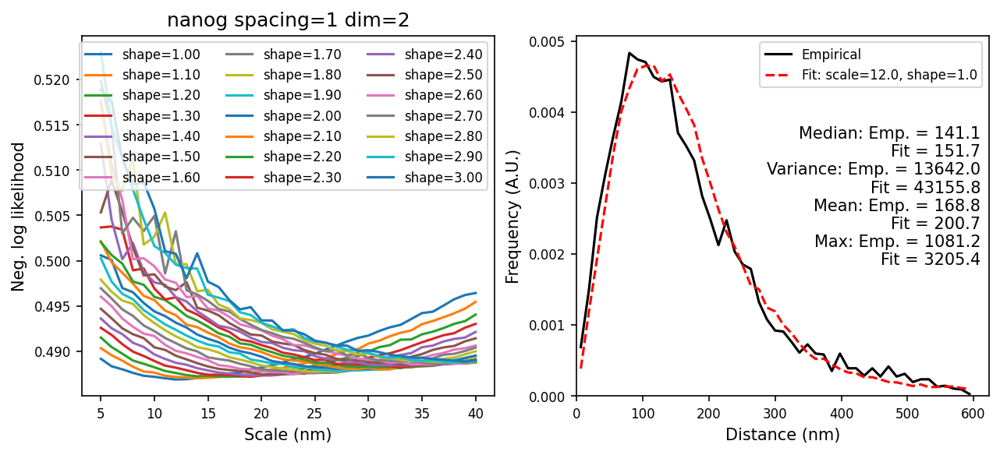

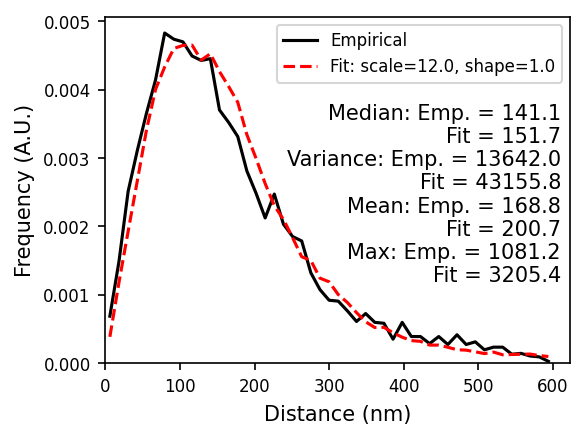

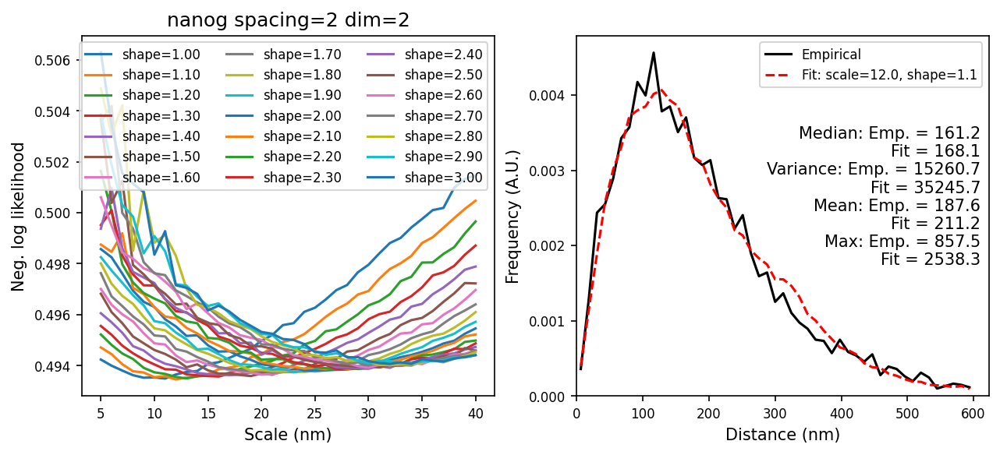

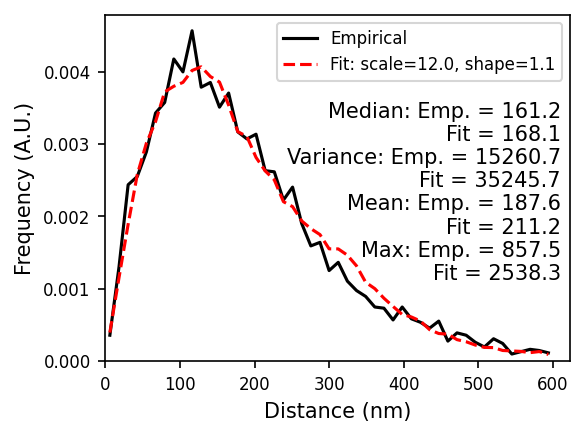

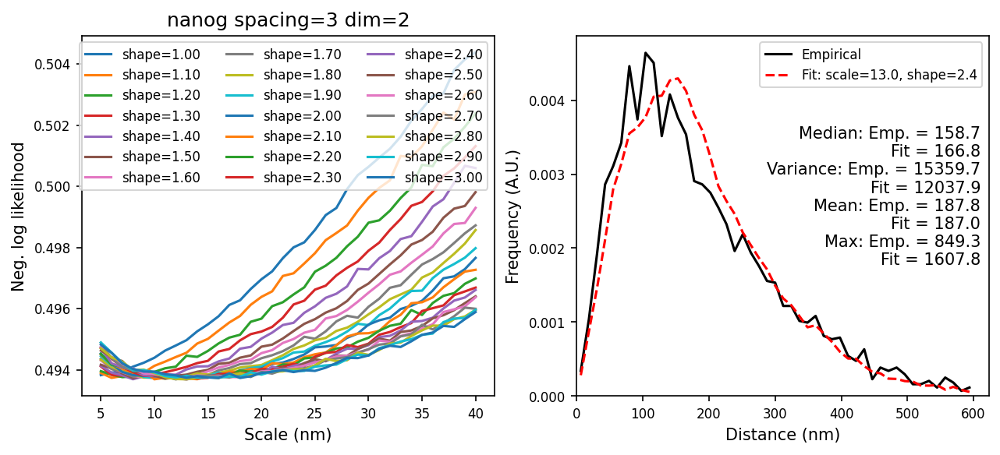

...

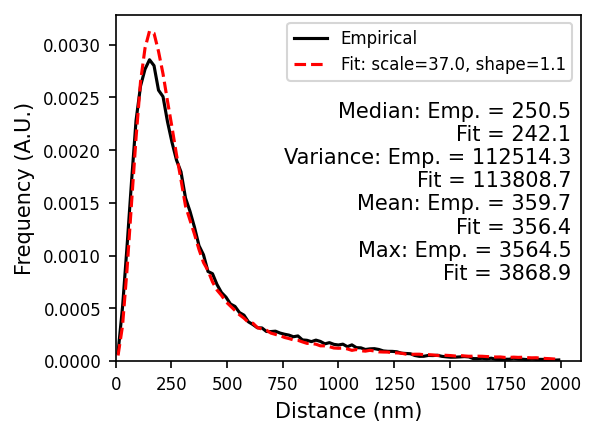

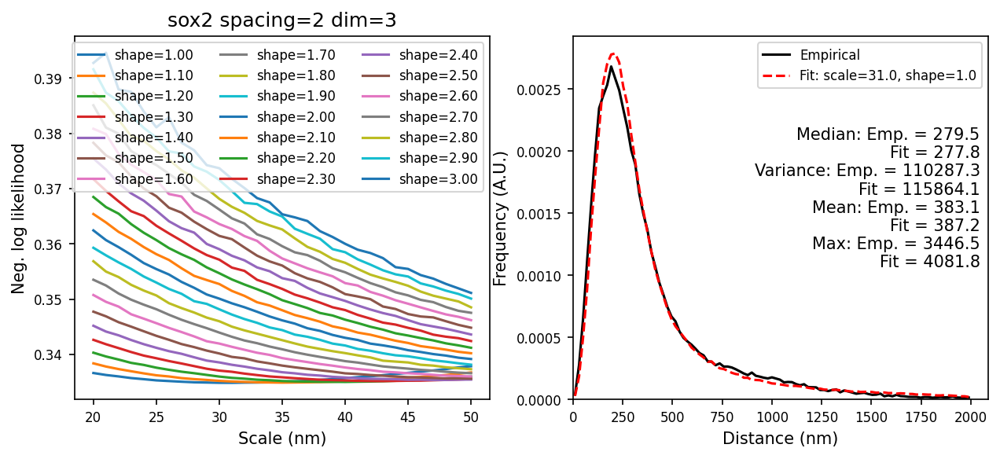

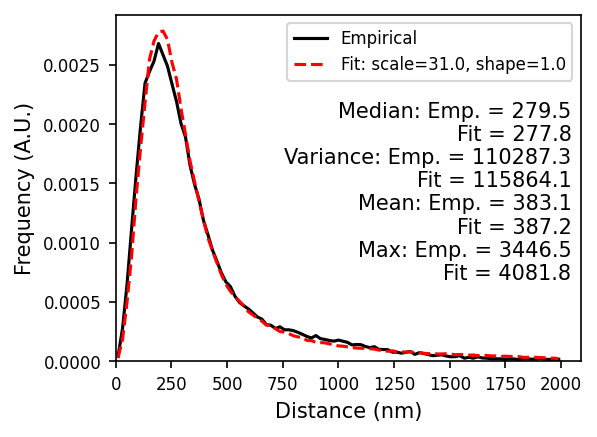

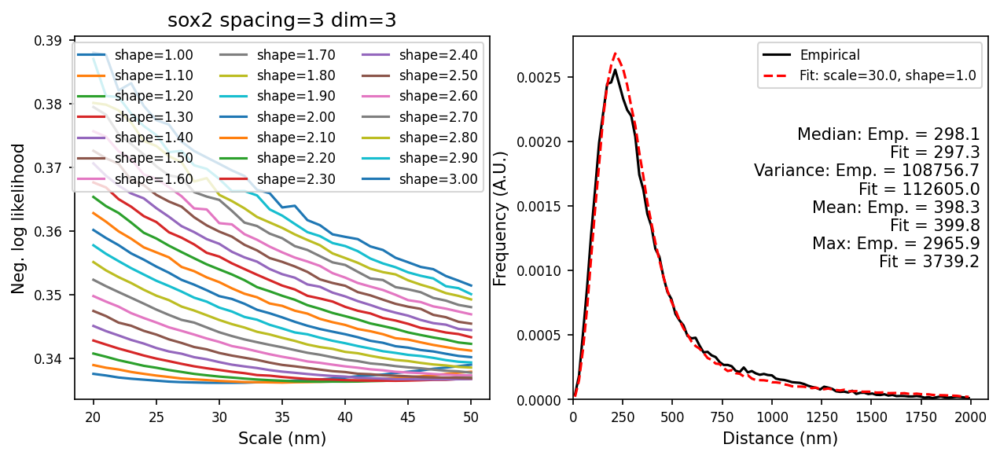

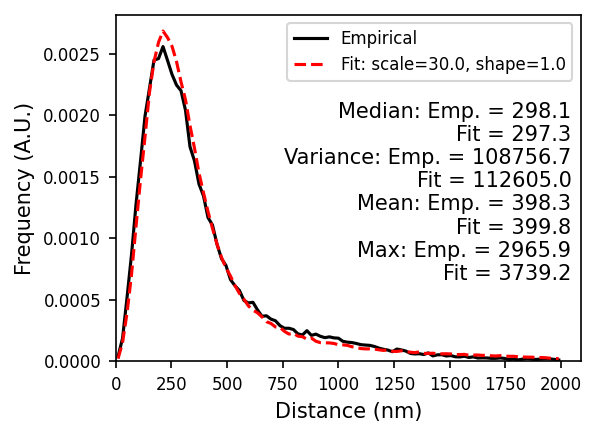

In [9]:
trials = [('nanog', 2, 'simulation'),
          ('nanog', 3, 'simulation'),
          ('sox2', 3, 'simulation'),]

for rep, k, sim in trials:
    for spacing in range(1, 4):
        for dist in ['t']:
            for metric in ['ll',]:
                if rep == 'sox2':
                    orca_positions = orca['wt'].select_region(start, end).positions[:, :, :k]
                    sim_positions = simulation[sim].select_region(start, end).positions[:, :, :k]
                    bins = np.linspace(0, 2000, 100)
                    scale_space = (20, 50, 31)
                    samples = 10_000
                elif rep == 'nanog':
                    orca_positions = nanog_orca['rep1']['esc'].positions[:, index_15kb, :k][:, ::2]
                    sim_positions = nanog_simulation[sim].positions[:, index_15kb, :k][:, ::2]
                    bins = np.linspace(0, 600, 50)
                    scale_space = (5, 40, 36)
                    samples = 20_000
                else:
                    assert False

                noisedist = NoiseDistribution(dist='t', max_val=2000)
                noisedist.fit_noise(orca_positions, bins, sim_positions=sim_positions, samples=samples, spacing=spacing, metric=metric,
                                    scale_space=scale_space)
                ax = noisedist.plot_noise_fit()
                ax[0].set_title(f'{rep} spacing={spacing} dim={k}')
                plt.show()

                ax = noisedist.plot_best_fit()
                plt.savefig(f'img/{rep}_noise_fit_k{k}_spacing{spacing}.pdf')
                plt.show()

# Distance scaling

In [10]:
noise = {
    'simulation': NoiseDistribution(dist='t', shape=1.0, scale=31.0, max_val=2000),
}

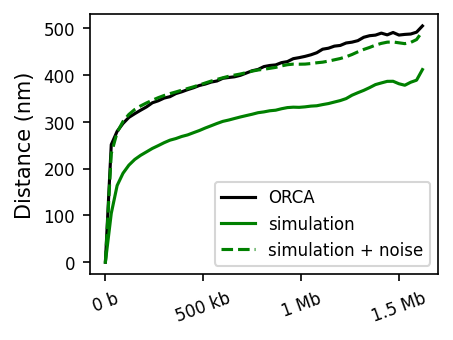

In [11]:
def plot_distance_scaling(ax, name, track, c=None, ls=None, distance_scale=1, scatter=True):
    x = track.x()
    x -= x[0]
    dists = distance_scale * get_section_distances(track.positions)

    ax.plot(x, dists, label=name, color=c, ls=ls)
    if scatter:
        ax.scatter(x, dists, color=c)

    ax.set_ylabel('Distance (nm)')
    format_ticks(ax, y=False)
    return ax

cut = 3
f, ax = plt.subplots(figsize=(3, 9/4))
track = orca['wt'].select_region(start, end)
plot_distance_scaling(ax, 'ORCA', track, c='black', scatter=False)

colors = ['green', 'red', 'magenta', 'blue', 'cyan']
for (name, track), color in zip(simulation.items(), colors):
    track = track.select_region(start, end)

    track_noisy = track.__copy__()
    track_noisy.positions = noise[name].add_noise(track_noisy.positions, samples=50)

    plot_distance_scaling(ax, name, track, c=color, scatter=False)
    plot_distance_scaling(ax, f'{name} + noise', track_noisy, c=color, ls='--', scatter=False)
ax.legend()
plt.savefig('img/orca_sox2_scaling.pdf')
plt.show()

/tmp/ipykernel_2503773/3986216620.py:6: RuntimeWarning: Mean of empty slice
  data = data - np.nanmean(data, axis=1, keepdims=True)
/tmp/ipykernel_2503773/3986216620.py:7: RuntimeWarning: Mean of empty slice
  rg = np.sqrt(np.nanmean(np.linalg.norm(data, axis=-1) ** 2, axis=1))


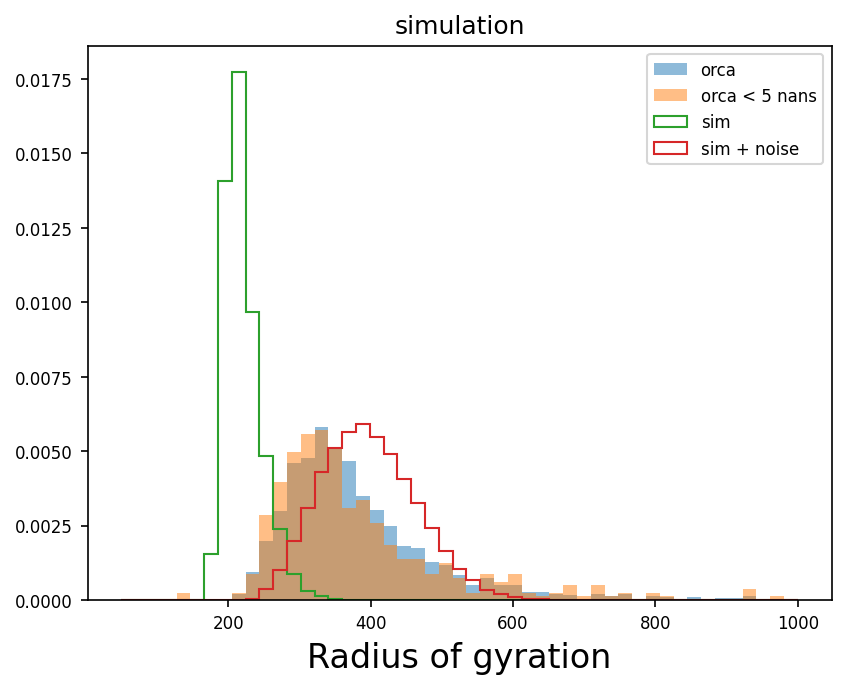

In [12]:
data = orca['wt'].select_region(start, end).positions
nans = np.isnan(data[:, :, 0]).sum(axis=1)

for name, track in simulation.items():
    def get_rg(data):
        data = data - np.nanmean(data, axis=1, keepdims=True)
        rg = np.sqrt(np.nanmean(np.linalg.norm(data, axis=-1) ** 2, axis=1))
        return rg
    
    track = track.select_region(start, end)
    track_noisy = track.__copy__()
    track_noisy.positions = noise[name].add_noise(track_noisy.positions, samples=50)

    bins = np.linspace(50, 1000, 50)
    rg = get_rg(data)
    plt.hist(rg, density=True, alpha=0.5, bins=bins, label='orca')

    rg = get_rg(data[nans < 5])
    plt.hist(rg, density=True, alpha=0.5, bins=bins, label='orca < 5 nans')

    rg = get_rg(track.positions)
    plt.hist(rg, density=True, histtype='step', bins=bins, label='sim')

    rg = get_rg(track_noisy.positions)
    plt.hist(rg, density=True, histtype='step', bins=bins, label='sim + noise')
    plt.xlabel('Radius of gyration', size=16)
    plt.legend()
    plt.title(name)
    plt.show()

# Boundary probabilities

(array([12, 19]),)
(55,) (2271, 55, 3) (2271, 55, 3) (2,)
(2271, 55, 3)
(2271, 55, 55)


/tmp/ipykernel_2503773/3119164595.py:24: RuntimeWarning: invalid value encountered in divide
  Z=VV/WW
/tmp/ipykernel_2503773/3119164595.py:91: RuntimeWarning: Mean of empty slice
  val_l,val_r = func(im_[x_im_l,y_im_l]),func(im_[x_im_r,y_im_r])
/tmp/ipykernel_2503773/3119164595.py:94: RuntimeWarning: Mean of empty slice
  val_l,val_r = func(im[x_im_l,y_im_l]),func(im[x_im_r,y_im_r])
/tmp/ipykernel_2503773/3119164595.py:98: RuntimeWarning: Mean of empty slice
  val_l,val_r = func(im_[xn_im_l,yn_im_l]),func(im_[xn_im_r,yn_im_r])
/tmp/ipykernel_2503773/3119164595.py:102: RuntimeWarning: Mean of empty slice
  val_l,val_r = func(im[xn_im_l,yn_im_l]),func(im[xn_im_r,yn_im_r])


Number of chromosomes: 2270
(array([], dtype=int64),)
(55,) (1600, 55, 3) (1600, 55, 3) (0,)
(1600, 55, 3)
(1600, 55, 55)


Number of chromosomes: 1599
(array([], dtype=int64),)
(55,) (1600, 55, 3) (1600, 55, 3) (0,)
(1600, 55, 3)
(1600, 55, 55)
Number of chromosomes: 1599


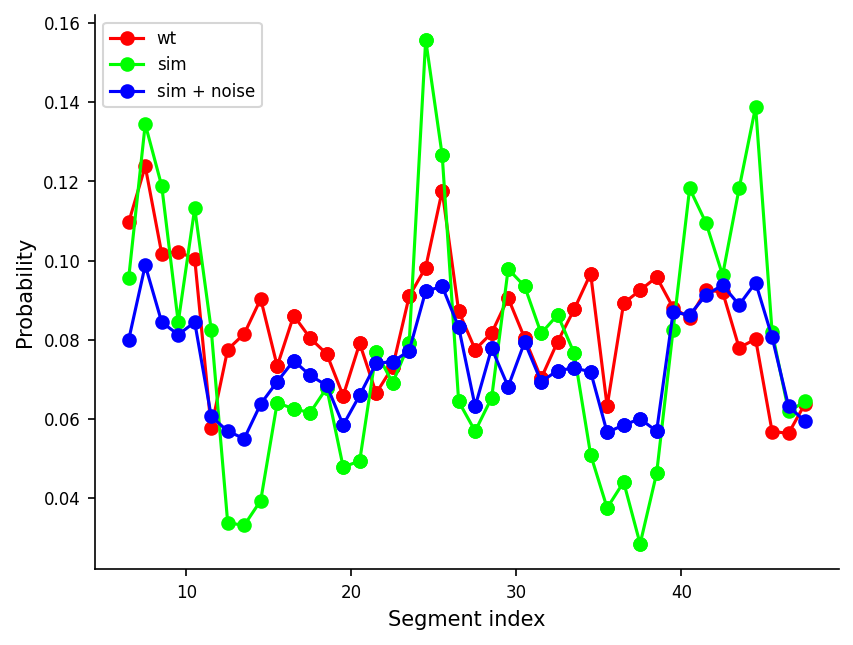

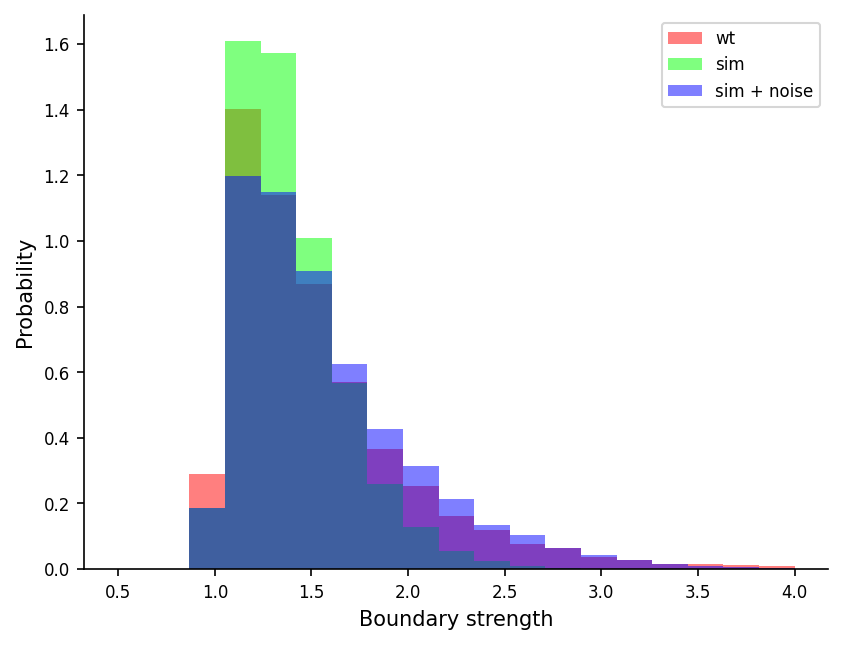

In [13]:
def fig_no_axis(**kwargs):
    """Get figure with no right/upper axis and which allows for saving text in pdf and larger font."""
    import matplotlib as mpl
    fig1, ax1 = plt.subplots(facecolor='white',**kwargs)
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)
    ax1.get_xaxis().tick_bottom()
    ax1.get_yaxis().tick_left()
    return fig1


def nan_gaussian_filter(mat,sigma,keep_nan=True):
    from scipy.ndimage import gaussian_filter
    U=np.array(mat)
    Unan = np.isnan(U)
    V=U.copy()
    V[U!=U]=0
    VV=gaussian_filter(V,sigma=sigma)

    W=0*U.copy()+1
    W[U!=U]=0
    WW=gaussian_filter(W,sigma=sigma)

    Z=VV/WW
    if keep_nan:
        Z[Unan]=np.nan
    return Z

def interp1dnan(A):
    #nan = np.nan
    #A = np.array([1, nan, nan, 2, 2, nan, 3,nan])
    A_=np.array(A)
    ok = np.isnan(A)==False
    xp = ok.ravel().nonzero()[0]
    fp = A[ok]
    x  = np.isnan(A).ravel().nonzero()[0]

    A_[np.isnan(A)] = np.interp(x, xp, fp)
    return A_

def get_ind_loc_max(ratio,cutoff_max=1.2,valley=3):
    ratio_ext = np.array([1]+list(ratio)+[1])
    local_max = np.where(((ratio_ext[1:-1]-ratio_ext[:-2])>0)&((ratio_ext[1:-1]-ratio_ext[2:])>0))[0]
    
    local_max_good = local_max[ratio[local_max]>cutoff_max]
    local_max_good_=[]
    for id_ in local_max_good:
        l = np.max([0,id_-valley])
        r = np.min([len(ratio),id_+valley])
        if ratio[id_]==np.nanmax(ratio[l:r]):
            local_max_good_.append(id_)
    return np.array(local_max_good_)

def get_boundaries(im, su=4, sl=2, cutoff_max=1.2,valley=3,gb=0.75,func=np.nanmean,plt_val=False,no_pts=False):
    img = nan_gaussian_filter(im,gb,keep_nan=True)
    im_=img
    for i in range(len(im_)):
        im_[i,i]=np.nan
    ratio,ration,center,centern=[],[],[],[]
    ratio_o,ration_o=[],[]
    for i in range(len(im)):
        x_im_l,y_im_l = [],[]
        x_im_r,y_im_r = [],[]

        xn_im_l,yn_im_l = [],[]
        xn_im_r,yn_im_r = [],[]

        for j in range(sl):
            xn_im_l.extend(i+j-np.arange(su))
            yn_im_l.extend([i+j]*su)
        for j in range(sl):
            xn_im_r.extend(i+j+sl-np.arange(su))
            yn_im_r.extend([i+j+sl]*su)

        for j in range(sl):
            x_im_l.extend(i+j+np.arange(su))
            y_im_l.extend([i+j]*su)
        for j in range(sl):
            x_im_r.extend(i+j+sl+np.arange(su))
            y_im_r.extend([i+j+sl]*su)

        x_im_l,y_im_l,x_im_r,y_im_r = map(np.array,[x_im_l,y_im_l,x_im_r,y_im_r])
        xn_im_l,yn_im_l,xn_im_r,yn_im_r = map(np.array,[xn_im_l,yn_im_l,xn_im_r,yn_im_r])

        in_image = np.all(x_im_l>=0) and np.all(x_im_r>=0) and np.all(y_im_l>=0) and np.all(y_im_r>=0)
        in_image = in_image and np.all(x_im_l<len(im)) and np.all(x_im_r<len(im)) and np.all(y_im_l<len(im)) and np.all(y_im_r<len(im))

        in_imagen = np.all(xn_im_l>=0) and np.all(xn_im_r>=0) and np.all(yn_im_l>=0) and np.all(yn_im_r>=0)
        in_imagen = in_imagen and np.all(xn_im_l<len(im)) and np.all(xn_im_r<len(im)) and np.all(yn_im_l<len(im)) and np.all(yn_im_r<len(im))
        if in_image:
            val_l,val_r = func(im_[x_im_l,y_im_l]),func(im_[x_im_r,y_im_r])
            #ratio.append(val_r/val_l)
            ratio.append(val_l/val_r)
            val_l,val_r = func(im[x_im_l,y_im_l]),func(im[x_im_r,y_im_r])
            ratio_o.append(val_l/val_r)
            center.append(i+sl)
        if in_imagen:
            val_l,val_r = func(im_[xn_im_l,yn_im_l]),func(im_[xn_im_r,yn_im_r])
            #ration.append(val_l/val_r)
            ration.append(val_r/val_l)
            
            val_l,val_r = func(im[xn_im_l,yn_im_l]),func(im[xn_im_r,yn_im_r])
            ration_o.append(val_r/val_l)
            centern.append(i+sl-1)
        if False:#i==9:
            plt.figure()
            plt.plot(xn_im_l,yn_im_l,'mo')
            plt.plot(xn_im_r,yn_im_r,'go')
            plt.plot(x_im_l,y_im_l,'ro')
            plt.plot(x_im_r,y_im_r,'bo')
            plt.imshow(im,interpolation='nearest',cmap='seismic')
            plt.show()
            print(x_im_l,y_im_l,x_im_r,y_im_r)

    center,ratio=np.array(center),np.array(ratio)
    centern,ration=np.array(centern),np.array(ration)

    local_max_good = get_ind_loc_max(ratio,cutoff_max=cutoff_max,valley=valley)
    local_max_goodn = get_ind_loc_max(ration,cutoff_max=cutoff_max,valley=valley)
    if plt_val:
        #plt.close('all')
        plt.figure(figsize=(12,7))
        #print local_max_good,local_max_goodn
        plt.plot(center,np.log(ratio),'o-')
        if len(local_max_good)>0:
            plt.plot(center[local_max_good],np.log(ratio[local_max_good]),'o')
        plt.plot(centern,np.log(ration),'o-')
        if len(local_max_goodn)>0:
            plt.plot(centern[local_max_goodn],np.log(ration[local_max_goodn]),'o')
        plt.show()
        fig, ax = plt.subplots(figsize=(12,7))
        if not no_pts:
            if len(local_max_good)>0:
                ax.plot(center[local_max_good],center[local_max_good],'go')
            if len(local_max_goodn)>0:
                ax.plot(centern[local_max_goodn],centern[local_max_goodn],'m>')
        cax = ax.imshow(set_diag(img,np.nanmax(img)),interpolation='nearest',cmap='bwr')#,vmax=1000,vmin=0)
        #ticks_ = np.linspace(0,0.8,4)
        cbar = fig.colorbar(cax)#,ticks=ticks_)
        #cbar.ax.set_yticklabels(map(str,np.round(ticks_**(1./0.15),2)))
        plt.show()
    if len(local_max_good)>0 and len(local_max_goodn)>0:
        return center[local_max_good],centern[local_max_goodn],ratio,ration,center,centern,ratio_o,ration_o
    else:
        return [None]*8


def StandardBoundaryAnalysis(tags,dic_zxys,gb=1,valley=1,su=10,sl=6,
                             coverage_th=0.5,bad_hybe_cov_th=0.5,
                             cols=[[[0,0,0],[0.5,0.5,0.5]]],overwrite=False,boundary_file = None,plt_val=True):
    """
    tags: list
        names of traces to analyze
    dic_zxys: dict[?, np.array]
        np.arrays of traces
    """
    
    from scipy.spatial.distance import pdist,squareform
    
    dic = {}
    #load boundary_file if exists
    if boundary_file is not None:
        if os.path.exists(boundary_file):
            dic = pickle.load(open(boundary_file,'rb'))
    
    for itag in range(len(tags)):
        tag = tags[itag]
        zxys=dic_zxys[tag]
        zxysf=np.array(zxys)
        if tag not in dic or overwrite:
            col = cols[itag]
            zxys=dic_zxys[tag]
            zxysf=np.array(zxys)
            #threshold on coverage
            if coverage_th is not None:
                coverage = 1-np.sum(np.isnan(zxysf[:,:,0]),1)/float(zxysf.shape[1])
                zxysf = zxysf[coverage>coverage_th]
            #interpolate over bad hybes
            if bad_hybe_cov_th is not None:
                zxysa = np.array([np.array(list(map(interp1dnan,zxys_.T))).T for zxys_ in zxysf])
                coverage = np.sum(np.isnan(zxysf[:,:,0]),0)/float(len(zxysf))
                bad_hybes = np.where(coverage>0.5)[0]
                print(np.where(coverage>0.5))
                print(coverage.shape, zxysf.shape, zxysa.shape, bad_hybes.shape)
                zxysb = np.array(zxysf)
                zxysb[:,bad_hybes]=zxysa[:,bad_hybes]
                zxysf = zxysb
            #compute matrices
            print(zxysf.shape)
            mats=np.array(list(map(squareform,list(map(pdist,zxysf)))))
            print(mats.shape)

            #initialize variables
            #There are two types of boundaries: start-of-a-block and end-of-a-block boundaries: a and b
            as_,bs_=[],[]#positions of the boundaries
            rsa,rsb=[],[]#strengths of the boundarries
            bds_cells,scorebds_cells=[],[]#positions per single cells and scores per single cells
            for imat_,mat_ in enumerate(mats[:]):
                #exclude trivial 0-diagonal
                mat_[np.arange(len(mat_)),np.arange(len(mat_))]=np.nan
                #for distance
                a,b,ra,rb,ca,cb,rao,rbo = get_boundaries(mat_,su=su,sl=sl,cutoff_max=1.,
                                                              valley=valley,gb=gb,func=np.nanmean,plt_val=False,no_pts=False)
                if a is not None:
                    a=np.array(a)
                    b=np.array(b)
                    a=a[(a<np.max(ca))&(a>np.min(ca))]
                    b=b[(b<np.max(cb))&(b>np.min(cb))]

                    rsa_=np.array(rao)[[list(ca).index(a_)for a_ in a]]
                    rsb_=np.array(rbo)[[list(cb).index(a_)for a_ in b]]

                    dica=dict(zip(a-0.5,rsa_))
                    dicb=dict(zip(b+0.5,rsb_))
                    unk = np.union1d(a-0.5,b+0.5)
                    score = [np.nanmean([dica.get(unk_,np.nan),dicb.get(unk_,np.nan)]) for unk_ in unk]
                    rsa.extend(rsa_)
                    rsb.extend(rsb_)
                    as_.extend(a)
                    bs_.extend(b)
                    bds_cells.append(unk)
                    scorebds_cells.append(score)
                    #break
                    if False:
                        plt.figure()
                        plt.plot(ca,rao,'r')
                        plt.plot(a,np.array(rao)[[list(ca).index(a_)for a_ in a]],'ro')
                        plt.plot(cb,rbo,'b')
                        plt.plot(b,np.array(rbo)[[list(cb).index(a_)for a_ in b]],'bo')


            print("Number of chromosomes:",imat_)
            x,y=np.unique(as_[::],return_counts=True)
            x=x-0.5
            y=y/float(imat_)
            dic_start = {x_:y_ for x_,y_ in zip(x,y)}
            x,y=np.unique(bs_[::],return_counts=True)
            x=x+0.5
            y=y/float(imat_)
            dic_end = {x_:y_ for x_,y_ in zip(x,y)}
            xs = np.sort(list(dic_start.keys())+list(dic_end.keys()))
            means = [np.nanmean([dic_start.get(x_,np.nan),dic_end.get(x_,np.nan)]) 
                     for x_ in xs]
            rsa_=rsa#np.log(rsa)
            rs1=np.array(rsa_)[(np.isnan(rsa_)==False)&(np.isinf(rsa_)==False)]
            rsa_=rsb
            rs2=np.array(rsa_)[(np.isnan(rsa_)==False)&(np.isinf(rsa_)==False)]
            rs = np.concatenate([rs1,rs2])


            dic[tag]={'xs':xs,'means':means,'rs':rs,'col':col,'bds_cells':bds_cells,'scorebds_cells':scorebds_cells}
        
        if plt_val:
            #### plots
            
            xs,means,rs,col = dic[tag]['xs'],dic[tag]['means'],dic[tag]['rs'],dic[tag]['col']
            fig_no_axis()
            plt.title(tag)
            plt.plot(xs,means,'o-',color=col[0])    
            plt.xlabel('Segment index')
            plt.ylabel('Probability')
            plt.xlim([0,len(zxysf[0])])
            plt.show()

            fig = fig_no_axis()
            plt.title(tag)
            vals,borders,_ =plt.hist(rs,bins=np.linspace(0.5,4,20),color=col[1])
            vls = np.linspace(0,np.max(vals),5)
            plt.yticks(vls,np.round(vls/len(rs),2))
            plt.xlabel('Boundary strength')
            plt.ylabel('Probability')
            plt.show()
        if boundary_file is not None:
            pickle.dump(dic,open(boundary_file,'wb'))
    return dic

dic_xyz = {'wt': orca['wt'].select_region(start, end).positions,
           'sim': simulation['simulation'].select_region(start, end).positions,
           'sim + noise': noise[name].add_noise(simulation['simulation'].select_region(start, end).positions, samples=1)
          }
tags = list(dic_xyz.keys())
dic = StandardBoundaryAnalysis(tags, dic_xyz, overwrite=True, plt_val=False,
                               cols=[[[1, 0, 0], [1, 0, 0]],
                                     [[0, 1, 0], [0, 1, 0]],
                                     [[0, 0, 1], [0, 0, 1]],
                                    ])

fig_no_axis()
for tag in dic:
    xs,means,rs,col = dic[tag]['xs'],dic[tag]['means'],dic[tag]['rs'],dic[tag]['col']
    plt.plot(xs,means,'o-',color=col[0], label=tag)

plt.xlabel('Segment index')
plt.ylabel('Probability')
plt.legend()
plt.show()

fig = fig_no_axis()
for tag in dic:
    xs,means,rs,col = dic[tag]['xs'],dic[tag]['means'],dic[tag]['rs'],dic[tag]['col']
    vals,borders,_ =plt.hist(rs,bins=np.linspace(0.5,4,20),color=col[1], alpha=0.5, label=tag, density=True)
plt.xlabel('Boundary strength')
plt.ylabel('Probability')
plt.legend()
plt.show()

wt (2355, 55, 3)


/tmp/ipykernel_2503773/483295809.py:5: RuntimeWarning: All-NaN slice encountered
  c1 = np.nanmedian(xyz1,0)
/tmp/ipykernel_2503773/483295809.py:6: RuntimeWarning: All-NaN slice encountered
  c2 = np.nanmedian(xyz2,0)


sim (1600, 55, 3)
sim + noise (1600, 55, 3)


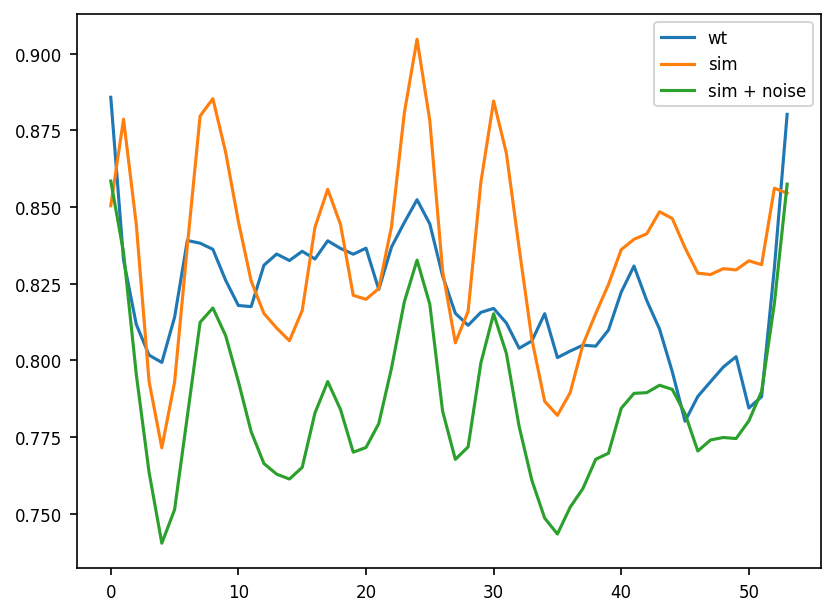

In [14]:
## Diffraction-limited/STORM separation score
def separation_score(xyz1, xyz2, plt_val=False):
    #xyz1 = np.random.random([10,2])
    #xyz2= np.random.random([20,2])+0.5
    c1 = np.nanmedian(xyz1,0)
    c2 = np.nanmedian(xyz2,0)
    #c0 = np.nanmean(np.concatenate([xyz1,xyz2],0),0)
    #c0 = (c1*len(xyz1)+c2*len(xyz2))/(len(xyz1)+len(xyz2))
    c0=(c1+c2)/2.
    cdif = c2-c1
    bad1 =np.sum(np.dot(xyz1-c0,cdif)>0) 
    bad2 = np.sum(np.dot(xyz2-c0,cdif)<0)
    bad =(bad1 +bad2)/float(len(xyz1)+len(xyz2))

    if plt_val:
        x1,y1 = np.array(xyz1).T[:2]
        x2,y2 = np.array(xyz2).T[:2]
        plt.plot([c0[0]-(c1-c2)[1]*1,c0[0]+(c1-c2)[1]*1],[c0[1]+(c1-c2)[0]*1,c0[1]-(c1-c2)[0]*1],'k-')
        plt.plot(x1,y1,'ro')
        plt.plot(x2,y2,'bo')
        plt.title('Red bad:'+str(bad1)+', blue bad:'+str(bad2))
    return 1-bad

dic_xyz = {'wt': orca['wt'].select_region(start, end).positions,
           'sim': simulation['simulation'].select_region(start, end).positions,
           'sim + noise': noise[name].add_noise(simulation['simulation'].select_region(start, end).positions, samples=1)
          }

for tag, positions in dic_xyz.items():
    positions = positions
    print(tag, positions.shape)
    w = 180_000 // 30_000
    scores = []
    for i in range(1, positions.shape[1]):
        up = positions[:, max(0, i-w):i]
        down = positions[:, i:min(positions.shape[1], i+w+1)]
        scores += [np.mean([separation_score(u, d) for u, d in zip(up, down)])]
    plt.plot(scores, label=tag)
plt.legend()
plt.show()

# Scatter plots

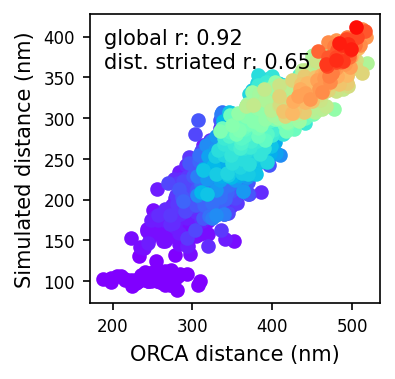

In [15]:
f, ax = plt.subplots(figsize=(2.5, 2.5))
offset_corr, global_corr = compare(positions_to_average_distance(orca['wt'].select_region(start, end).positions),
                                   positions_to_average_distance(simulation['simulation'].positions), ax=ax)
text = f'global r: {global_corr[0]:.2f}\ndist. striated r: {np.mean(offset_corr):.2f}'
ax.text(0.05, 0.95, text, transform=ax.transAxes, va='top', ha='left')
#ax.set_aspect('equal')
ax.set_ylabel('Simulated distance (nm)')
ax.set_xlabel('ORCA distance (nm)')
plt.savefig(f'img/orca_sox2_scatter.pdf')
plt.show()

orca distance (nm) - log rcmc contacts
orca distance (nm) - log rcmc neighbor contacts
orca distance (nm) simulation distance (nm)
orca distance (nm) simulation noisy distance (nm)
- log rcmc contacts - log rcmc neighbor contacts
- log rcmc contacts simulation distance (nm)
- log rcmc contacts simulation noisy distance (nm)
- log rcmc neighbor contacts simulation distance (nm)
- log rcmc neighbor contacts simulation noisy distance (nm)
simulation distance (nm) simulation noisy distance (nm)


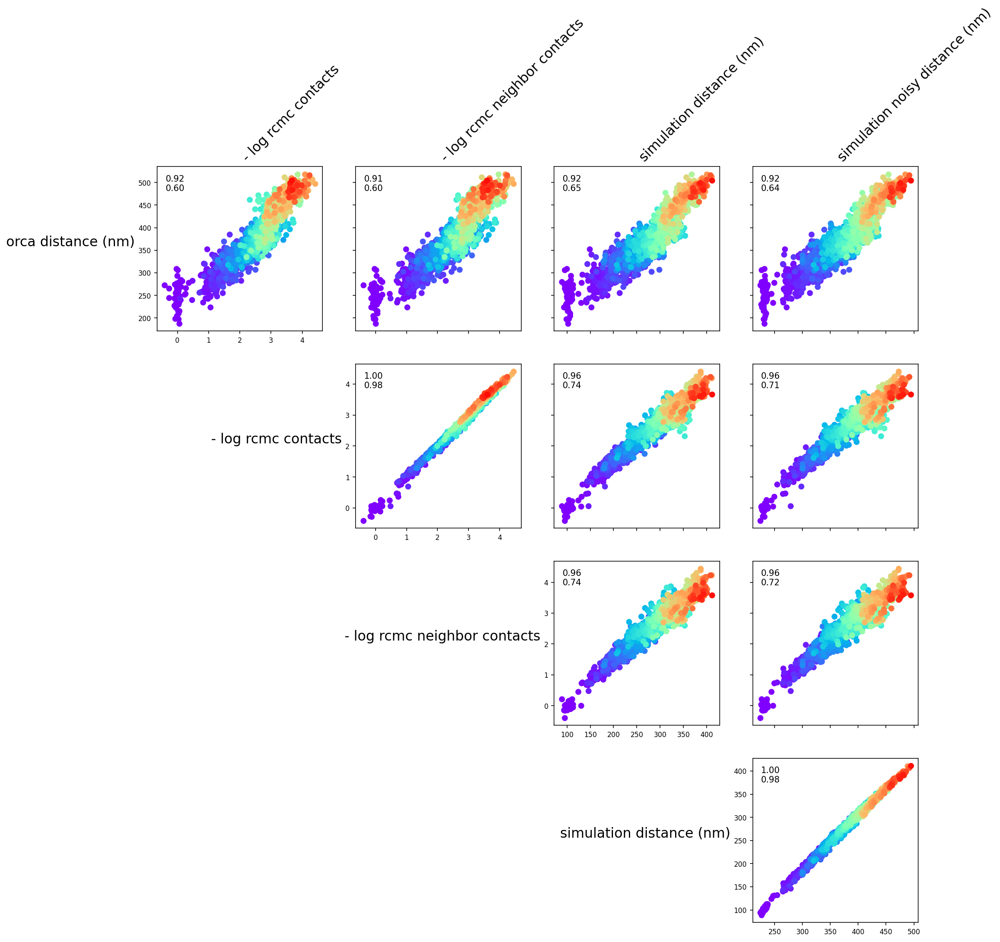

In [16]:
measurements = [
    ('orca distance (nm)', positions_to_average_distance(orca['wt'].select_region(start, end).positions)),
    #('dipc (nm)', positions_to_average_distance(dipc.coarsen(orca['wt'].select_region(start, end).regions).positions)),
    ('- log rcmc contacts', - np.log(ice_contact_map.contact_map)),
    ('- log rcmc neighbor contacts', - np.log(neighbor_contact_map.contact_map))
]
for name in simulation:
    measurements += [(f'{name} distance (nm)', positions_to_average_distance(simulation[name].positions))]
    
    sim_noisy = simulation[name].__copy__()
    sim_noisy.positions = noise[name].add_noise(sim_noisy.positions, samples=50)
    measurements += [(f'{name} noisy distance (nm)', positions_to_average_distance(sim_noisy.positions))]

scatter_grid(measurements)
plt.show()

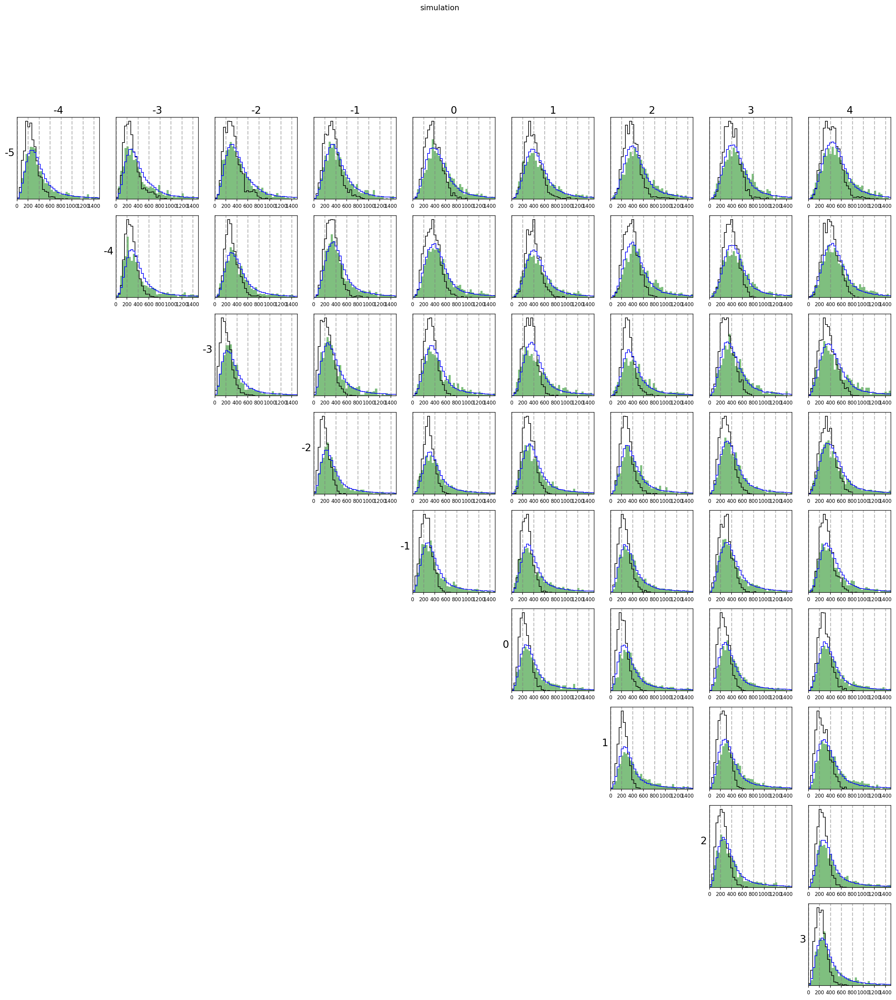

In [17]:
skip = 6
for name in simulation:
    sim = positions_to_distances(simulation[name].positions[:, ::skip])
    sim_noisy = simulation[name].__copy__()
    sim_noisy.positions = noise[name].add_noise(sim_noisy.positions, samples=50)
    sim_noisy = positions_to_distances(sim_noisy.positions[:, ::skip])
    orca_rep1 = positions_to_distances(orca['wt'].select_region(start, end).positions[:, ::skip])
    hist_grid(sim, sim_noisy, orca_rep1, high=1500)
    plt.suptitle(name)
    plt.show()

simulation
0 1 50 12
1 17 50 12
2 33 50 12
3 50 50 12


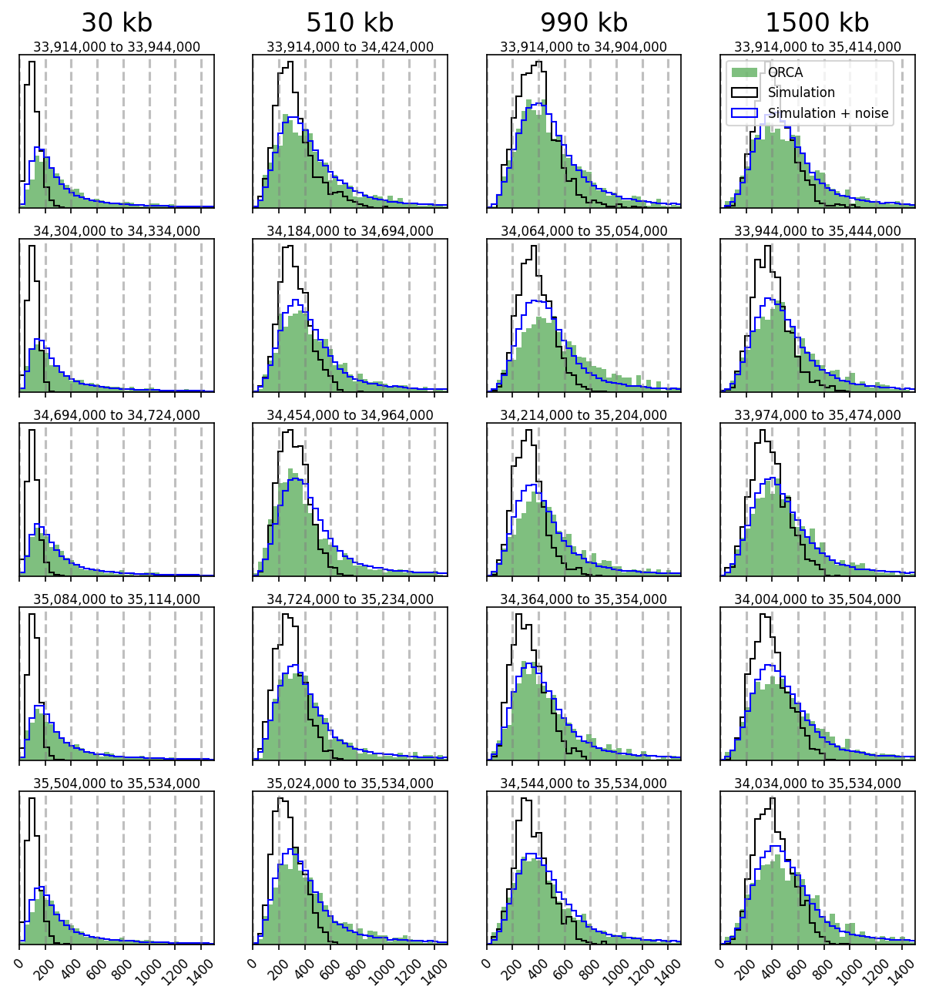

In [18]:
for name in simulation:
    print(name)
    sim = positions_to_distances(simulation[name].positions)
    sim_noisy = simulation[name].__copy__()
    sim_noisy.positions = noise[name].add_noise(sim_noisy.positions, samples=50)
    sim_noisy = positions_to_distances(sim_noisy.positions)
    orca_rep1 = positions_to_distances(orca['wt'].select_region(start, end).positions)
    hist_grid_examples(start, sim, sim_noisy, orca_rep1, high=1500, stride_kb=30)
    plt.savefig(f"img/sox2_dists_{name.replace(' ', '_')}.pdf")
    plt.show()

# Direct comparisons

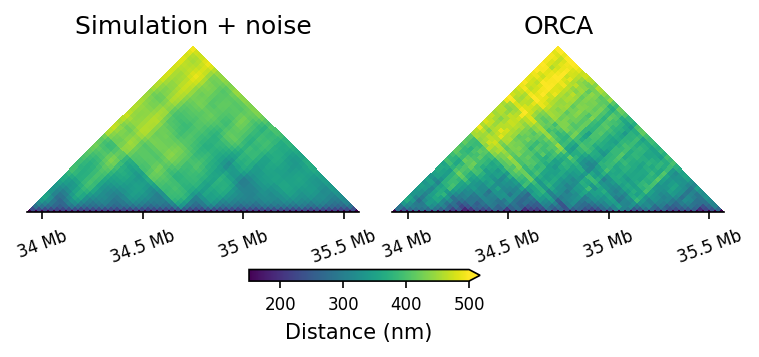

In [21]:
def track_data_to_contact_map(track_data):
    assert track_data.is_compact()
    dists = positions_to_average_distance(track_data.positions)

    start = track_data.regions[0][0]
    end = track_data.regions[-1][1]
    resolution = (end - start) // dists.shape[0]
    return ContactMap(dists, chrom=track_data.chrom, start=start, end=end, resolution=resolution)

# def compare_dists_main(orca, simulation, simulation_noisy, max_dist=600):
#     orca_dists = track_data_to_contact_map(orca)
#     sim_dists = track_data_to_contact_map(simulation)
#     sim_noisy_dists = track_data_to_contact_map(simulation_noisy)

#     f, ax = plt.subplots(1, 4, figsize=(15, 3), sharey=True)

#     cmap = 'viridis'
#     vmin = 0
#     vmax = max_dist
#     ax[0].set_title('Simulation')
#     sim_dists.plot_contact_map_horizontal(ax=ax[0], vmax=vmax, vmin=vmin, cmap=cmap, log_norm=False)
#     ax[1].set_title('Simulation + noise')
#     sim_noisy_dists.plot_contact_map_horizontal(ax=ax[1], vmax=vmax, vmin=vmin, cmap=cmap, log_norm=False)
#     ax[2].set_title('ORCA')
#     orca_dists.plot_contact_map_horizontal(ax=ax[2], vmax=vmax, vmin=vmin, cmap=cmap, log_norm=False)

#     cmap = 'coolwarm'
#     vmin = -1
#     vmax = 1
#     ax[3].set_title('log2(Simulation + noise / ORCA)')
#     diff = ContactMap(np.log2(sim_noisy_dists.contact_map / orca_dists.contact_map),
#                       chrom=orca_dists.chrom, start=orca_dists.start, end=orca_dists.end, resolution=orca_dists.resolution)
#     diff.plot_contact_map_horizontal(ax=ax[3], vmax=vmax, vmin=vmin, cmap=cmap, log_norm=False)

# region = '{}:{}-{}'.format(chrom, start, end)
# sim_condition = 'simulation'
# simulation_noisy = simulation[sim_condition].select_region(start, end)
# simulation_noisy.positions =  noise[name].add_noise(simulation_noisy.positions, samples=50)


def compare_dists_main(orca, simulation, simulation_noisy, max_dist=600):
    orca_dists = track_data_to_contact_map(orca)
    sim_dists = track_data_to_contact_map(simulation)
    sim_noisy_dists = track_data_to_contact_map(simulation_noisy)

    f, ax = plt.subplots(1, 2, figsize=(6, 2.5), gridspec_kw={'wspace': 0.1})

    cmap = 'viridis'
    vmin = 150
    vmax = max_dist
    ax[0].set_title('Simulation + noise')
    sim_noisy_dists.plot_contact_map_horizontal(ax=ax[0], vmax=vmax, vmin=vmin, cmap=cmap, log_norm=False, colorbar=False)
    ax[1].set_title('ORCA')
    im = orca_dists.plot_contact_map_horizontal(ax=ax[1], vmax=vmax, vmin=vmin, cmap=cmap, log_norm=False, colorbar=False)
    f.colorbar(im, ax=[ax[0], ax[1]], orientation='horizontal', fraction=0.04, pad=0.2, extend='max', label='Distance (nm)')

    for i in range(2):
        # turn off the left, right, and top spines and yticks
        ax[i].spines['left'].set_visible(False)
        ax[i].spines['right'].set_visible(False)
        ax[i].spines['top'].set_visible(False)
        ax[i].set_yticks([])

region = '{}:{}-{}'.format(chrom, start, end)
sim_condition = 'simulation'
simulation_noisy = simulation[sim_condition].select_region(start, end)
simulation_noisy.positions =  noise[name].add_noise(simulation_noisy.positions, samples=50)

compare_dists_main(orca['wt'].select_region(start, end),
              simulation[sim_condition].select_region(start, end),
              simulation_noisy, max_dist=500)
plt.savefig('img/sox2_distance_heatmaps.pdf')
plt.show()

/orcd/home/002/joepaggi/maxentnuc/maxentnuc/analysis/analysis_orca.py:376: RuntimeWarning: invalid value encountered in divide
  plot_pairwise(np.log2(sim_noisy_dists / orca_dists), region, ax=ax[3], vmax=vmax, vmin=vmin, cmap=cmap, log_norm=False)


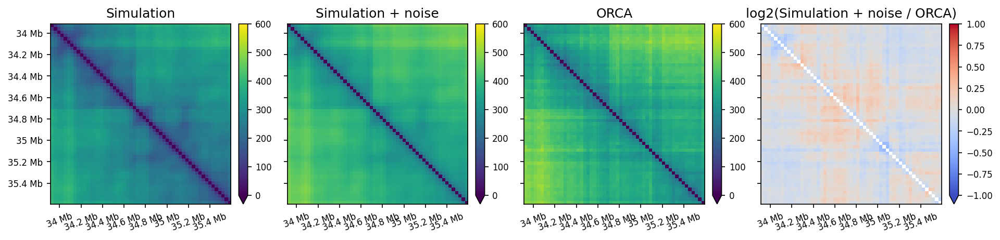

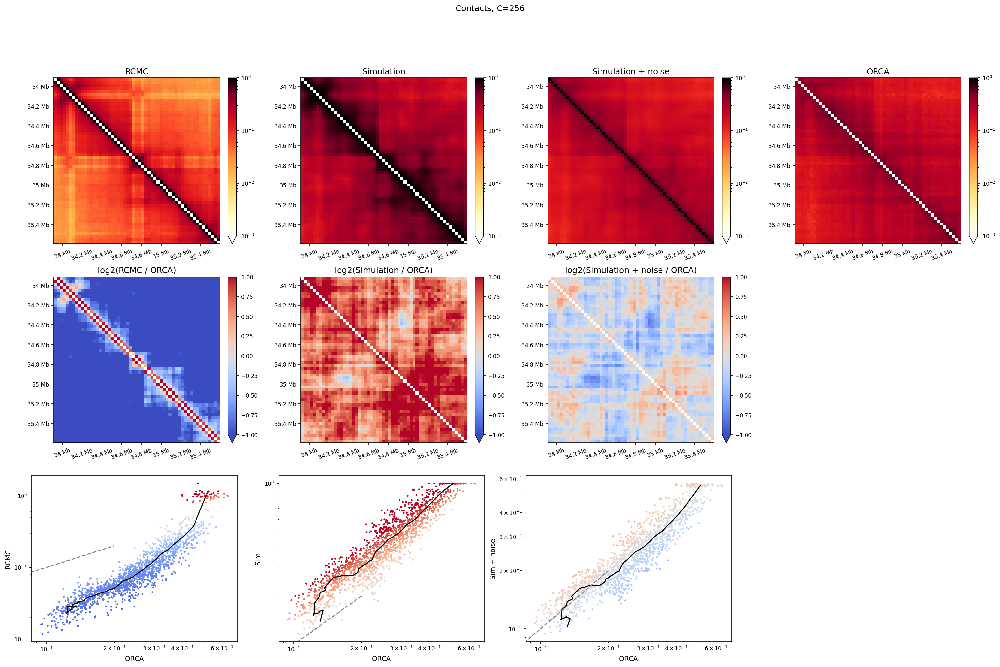

/orcd/home/002/joepaggi/maxentnuc/maxentnuc/analysis/analysis_orca.py:328: RuntimeWarning: divide by zero encountered in log2
  plot_pairwise(np.log2(sim_contacts / orca_contacts), region, ax=ax[1, 1], vmax=vmax, vmin=vmin, cmap=cmap, log_norm=False)


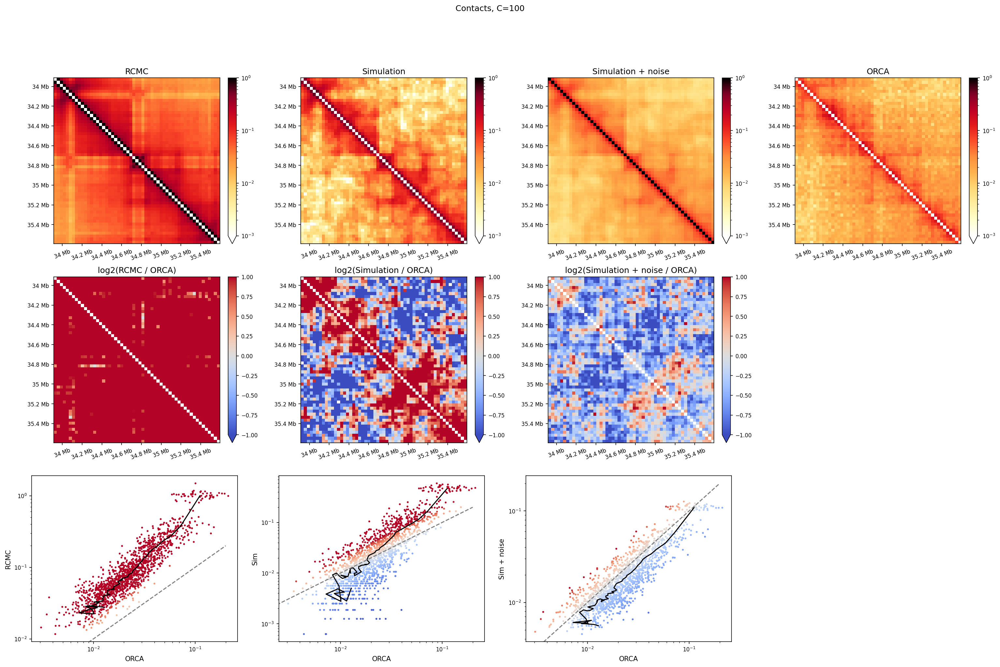

/orcd/home/002/joepaggi/maxentnuc/maxentnuc/analysis/analysis_orca.py:326: RuntimeWarning: divide by zero encountered in divide
  plot_pairwise(np.log2(rcmc_contacts / orca_contacts), region, ax=ax[1, 0], vmax=vmax, vmin=vmin, cmap=cmap, log_norm=False)
/orcd/home/002/joepaggi/maxentnuc/maxentnuc/analysis/analysis_orca.py:328: RuntimeWarning: divide by zero encountered in divide
  plot_pairwise(np.log2(sim_contacts / orca_contacts), region, ax=ax[1, 1], vmax=vmax, vmin=vmin, cmap=cmap, log_norm=False)
/orcd/home/002/joepaggi/maxentnuc/maxentnuc/analysis/analysis_orca.py:328: RuntimeWarning: invalid value encountered in divide
  plot_pairwise(np.log2(sim_contacts / orca_contacts), region, ax=ax[1, 1], vmax=vmax, vmin=vmin, cmap=cmap, log_norm=False)
/orcd/home/002/joepaggi/maxentnuc/maxentnuc/analysis/analysis_orca.py:330: RuntimeWarning: divide by zero encountered in divide
  plot_pairwise(np.log2(sim_noisy_contacts / orca_contacts), region, ax=ax[1, 2], vmax=vmax, vmin=vmin, cmap=cmap

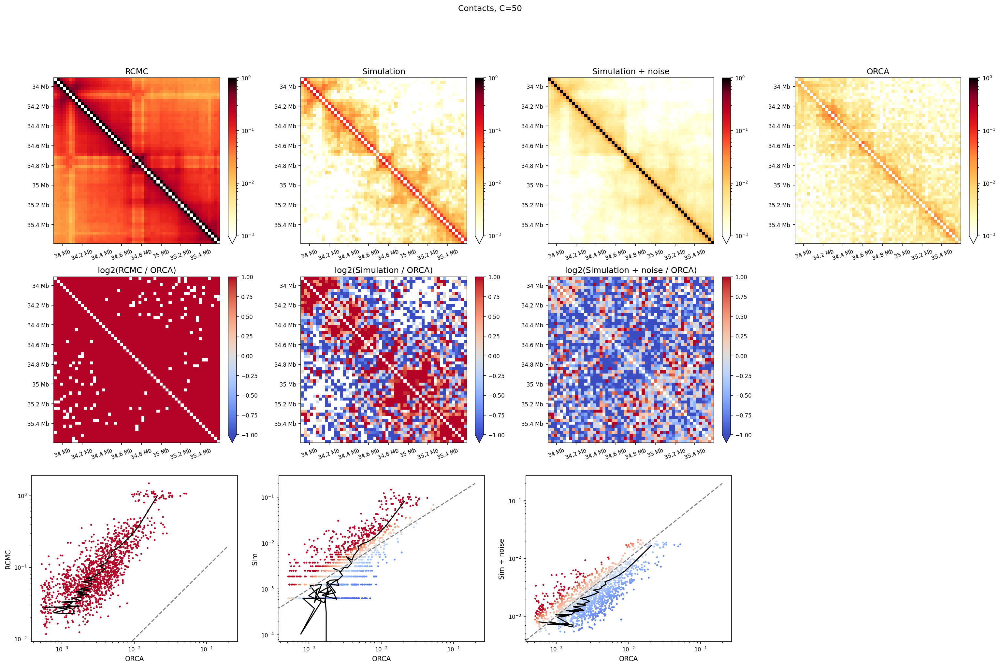

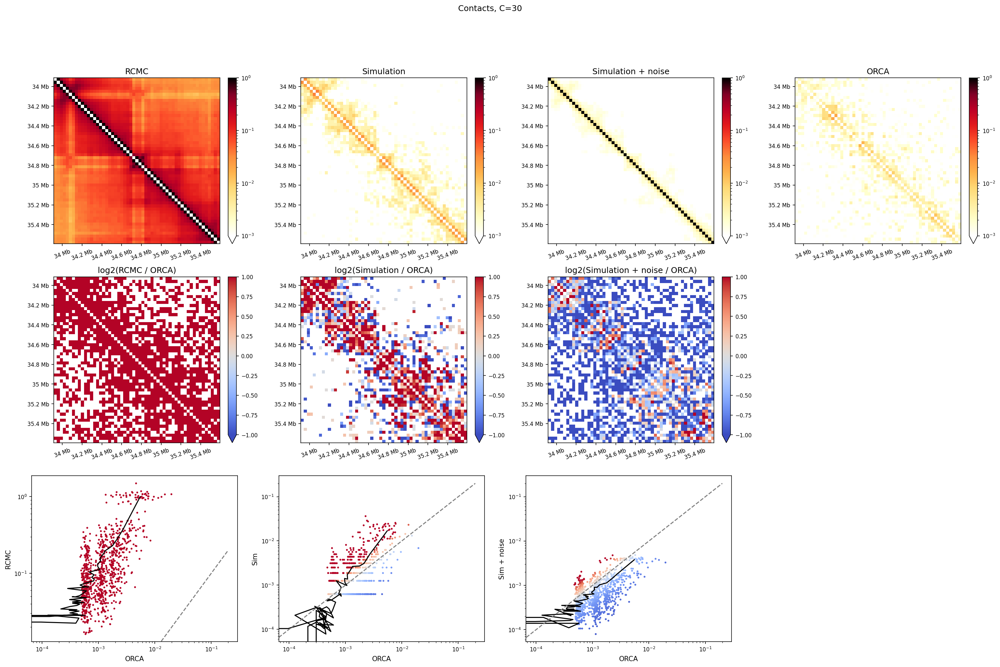

In [22]:
region = '{}:{}-{}'.format(chrom, start, end)
sim_condition = 'simulation'
simulation_noisy = simulation[sim_condition].select_region(start, end)
simulation_noisy.positions =  noise[name].add_noise(simulation_noisy.positions, samples=50)

compare_dists(orca['wt'].select_region(start, end),
              simulation[sim_condition].select_region(start, end),
              simulation_noisy,
              region)
plt.show()

for C in [256, 100, 50, 30]:
    compare_contacts(orca['wt'].select_region(start, end),
                     simulation[sim_condition].select_region(start, end),
                     simulation_noisy, neighbor_contact_map.contact_map, region, C)
    plt.suptitle(f'Contacts, C={C}')
    plt.show()

986
3


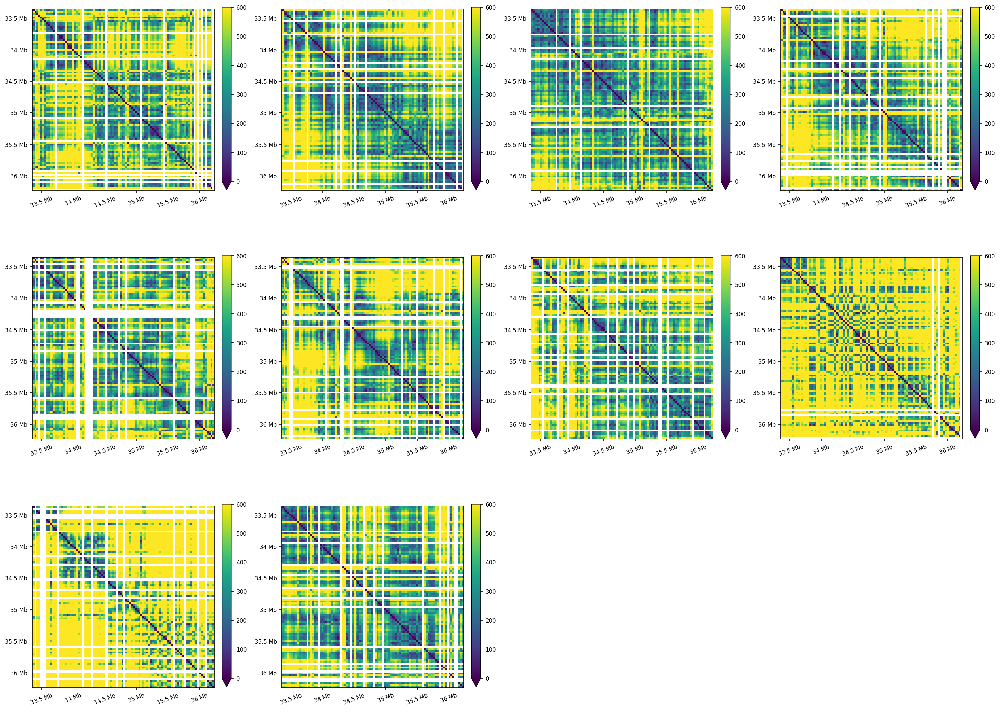

In [23]:
import matplotlib.pyplot as plt
import numpy as np

track = orca['wt']
dists = positions_to_distances(track.positions)

# Filter out distance matrices with more than 30% NaN values
valid_dists = [dist for dist in dists if np.isnan(dist).mean() <= 0.3]
print(len(valid_dists))
valid_dists = valid_dists[:10]

# Determine grid size
n = len(valid_dists)
cols = 4
rows = (n + cols - 1) // cols
print(rows)
# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))

# Flatten axes for easy iteration
axes = axes.flatten()

# Plot each valid distance matrix
for i, dist in enumerate(valid_dists):
    plot_pairwise(dist, f'{chrom}:{track.regions[0][0]}-{track.regions[-1][-1]}', vmin=0, vmax=600, cmap='viridis', ax=axes[i], log_norm=False)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

In [24]:
supercloud = '/orcd/home/002/joepaggi/orcd/pool'
annotations = load_annotations(annotations=f'{supercloud}/ucsc/mm39_gene.gtf', alias=f'{supercloud}/ucsc/mm39.chromAlias.txt')

genes = ['Sox2']
positions = []
for gene in genes:
    gene = annotations.loc[annotations.gene == gene]
    assert len(gene) == 1
    gene = gene.iloc[0]
    if gene.strand == '+':
        positions.append((gene.start - start) // 200)
    else:
        positions.append((gene.end - start) // 200)

print(' '.join(map(str, positions)))

3950


Gene Sox2 start: 34704144, closest ORCA position: 34689194.0, diff: -14950.0


/home/joepaggi/miniconda3/envs/neighbor/lib/python3.12/site-packages/MDAnalysis/coordinates/DCD.py:165: DeprecationWarning: DCDReader currently makes independent timesteps by copying self.ts while other readers update self.ts inplace. This behavior will be changed in 3.0 to be the same as other readers. Read more at https://github.com/MDAnalysis/mdanalysis/issues/3889 to learn if this change in behavior might affect you.
  warnings.warn("DCDReader currently makes independent timesteps"
/home/joepaggi/miniconda3/envs/neighbor/lib/python3.12/site-packages/MDAnalysis/coordinates/DCD.py:326: DeprecationWarning: asel argument to timeseries will be renamed to'atomgroup' in 3.0, see #3911
  warnings.warn(


simulation 3875 34689000
orca 34689194.0


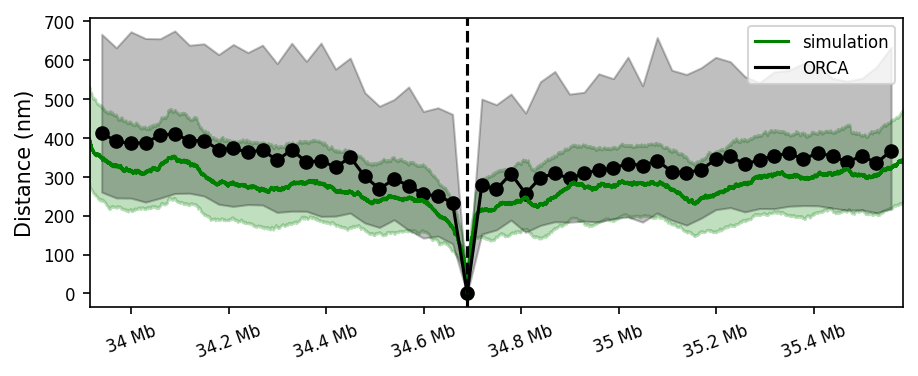

orca 34689194.0


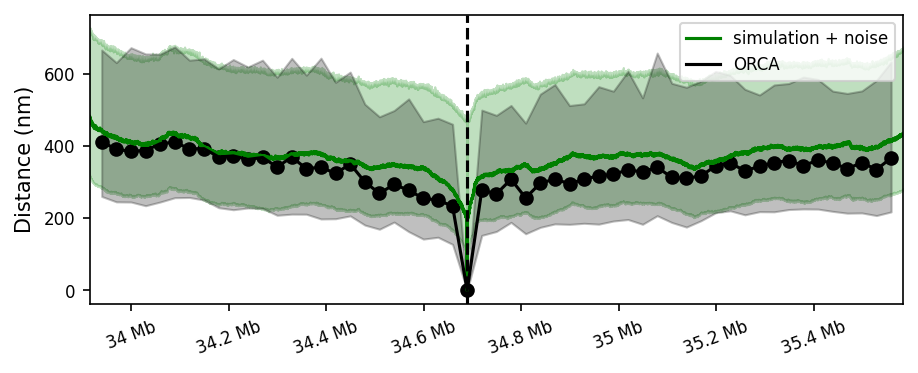

In [25]:
k = 3
low=20
mid=25
buf = 25_000

def show(ax, x, y, color, label, add_labels=False, label_x=None):
    ax.plot(x, np.nanpercentile(y, 50, axis=0), label=label, c=color)
    ax.fill_between(x,
                    np.nanpercentile(y, low, axis=0),
                    np.nanpercentile(y, 100-low, axis=0),
                    alpha=0.25, color=color)

    if add_labels:
        if label_x is None:
            label_x = x[100]
        for t in [low, 50, 100-low]:
            v = np.nanpercentile(y, t, axis=0)[np.argmin(np.abs(label_x-x))]
            ax.text(label_x, v, f'{t}%', color='black', size=12, ha='center', va='center',
                    bbox={'facecolor': 'white', 'edgecolor': 'none', 'alpha': 0.5})

gene = 'Sox2'
gene_start = annotations[annotations.gene == gene].start.values[0]

x = orca['wt'].x()
closest = np.argmin(np.abs(x - gene_start))
diff = x[closest] - gene_start
print(f'Gene {gene} start: {gene_start}, closest ORCA position: {x[closest]}, diff: {diff}')
gene_start += int(diff)  # align the gene start with the ORCA coordinates

for name, info in conditions.items():
    info = conditions[name]
    positions = load_polymer(info['psf'], info['dcd'], info['selection'], info['scale'], skip=11, burnin=0.0)
    positions = np.array(positions)
    index_promoter = (gene_start - start) // 200
    print('simulation', index_promoter, start + index_promoter * 200)

    for noisy in [False, True]:
        f, ax = plt.subplots(figsize=(7, 2.5))

        if noisy:
            _positions = noise[name].add_noise(positions, samples=10)
        else:
            _positions = positions

        distances = np.linalg.norm(_positions - _positions[:, index_promoter:index_promoter+1], axis=-1)

        orca_coords = orca['wt'].select_region(start, end).x()
        i = np.argmin(np.abs(orca_coords - gene_start))
        print('orca', orca_coords[i])
        orca_positions = orca['wt'].select_region(start, end).positions
        orca_distances_from_nanog = positions_to_distances(orca_positions)[:, i]

        label = f'{name} + noise' if noisy else name
        show(ax, np.arange(start, end, 200), distances, 'green', label, add_labels=False)
        ax.scatter(orca_coords, np.nanmedian(orca_distances_from_nanog, axis=0), color='black')
        show(ax, orca_coords, orca_distances_from_nanog, 'black', 'ORCA')

        ax.axvline(gene_start, color='black', linestyle='--')
        ax.set_xlim(start, end)
        format_ticks(ax, y=False)
        #ax.set_ylim(0, 500)
        ax.set_xlim(orca_coords[0] - buf, orca_coords[-1] + buf)
        ax.set_ylabel('Distance (nm)')
        ax.legend(loc='upper right')
        plt.savefig(f'img/orca_sox2_trace_noise{int(noisy)}.pdf')
        plt.show()

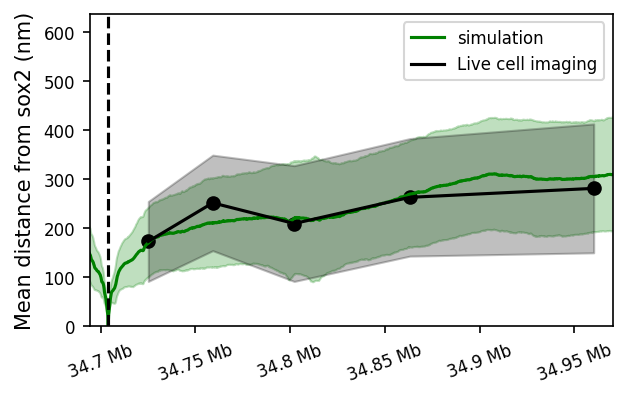

In [26]:
# From Single-gene imaging links genome topology, promoter–enhancer communication and transcription control, EDF 4.
# I'm not sure if sox2 is tagged directly at the promoter or a few kb upstream.
# Also the probes cover I think 1 kb or so?
fish = {
    21: 141.04254,
    55: 205.33906,
    98: 170.87288,
    159: 214.58759,
    256: 229.55139
}

fish_stddev = {
    21: 66.65121,
    55: 79.66532,
    98: 96.54362,
    159: 98.0231,
    256: 107.46523
}

#gene_start = start + shift
gene = 'Sox2'
gene_start = annotations[annotations.gene == gene].start.values[0]

for name, info in conditions.items():
    info = conditions[name]
    positions = load_polymer(info['psf'], info['dcd'], info['selection'], info['scale'], skip=11, burnin=0.0)
    positions = np.array(positions)
    index_promoter = (gene_start - start) // 200
    f, ax = plt.subplots(figsize=(4.5, 3*9/10))

    distances = np.linalg.norm(positions - positions[:, index_promoter:index_promoter+1], axis=-1)
    mean = np.nanmean(distances, axis=0)
    std = np.nanstd(distances, axis=0)
    ax.plot(range(start, end, 200), mean, label=name, c='green')
    ax.fill_between(range(start, end, 200),
                    mean - std,
                    mean + std,
                    alpha=0.25, color='green')

    fish_x, fish_y, fish_std = [], [], []
    for offset, dist in fish.items():
        fish_x += [offset*1000 + gene_start]
        fish_y += [dist * np.sqrt(3/2)]
        fish_std += [fish_stddev[offset] * np.sqrt(3/2)]
    ax.plot(fish_x, fish_y, c='black', label='Live cell imaging')
    ax.scatter(fish_x, fish_y, c='black')
    ax.fill_between(fish_x,
                    np.array(fish_y) - np.array(fish_std),
                    np.array(fish_y) + np.array(fish_std),
                    alpha=0.25, color='black')

    plt.axvline(gene_start, color='black', linestyle='--')
    plt.xlim(gene_start - 10000, fish_x [-1] + 10000)
    format_ticks(ax, y=False)
    plt.ylim(0)
    plt.legend()
    plt.ylabel('Mean distance from sox2 (nm)')
    plt.savefig(f'img/orca_sox2_trace_fish.pdf')
    plt.show()

In [27]:
np.std([0, 1])

np.float64(0.5)

In [28]:
contact_map = ContactMap(2*np.load(f'{mei_runs}/sox2/v11/processed_contact_map.npy'),
                         chrom='chr3', start=33_914_000, end=35_594_000, resolution=200)

[ 735  804 3479 3957 4488 6825 7793]


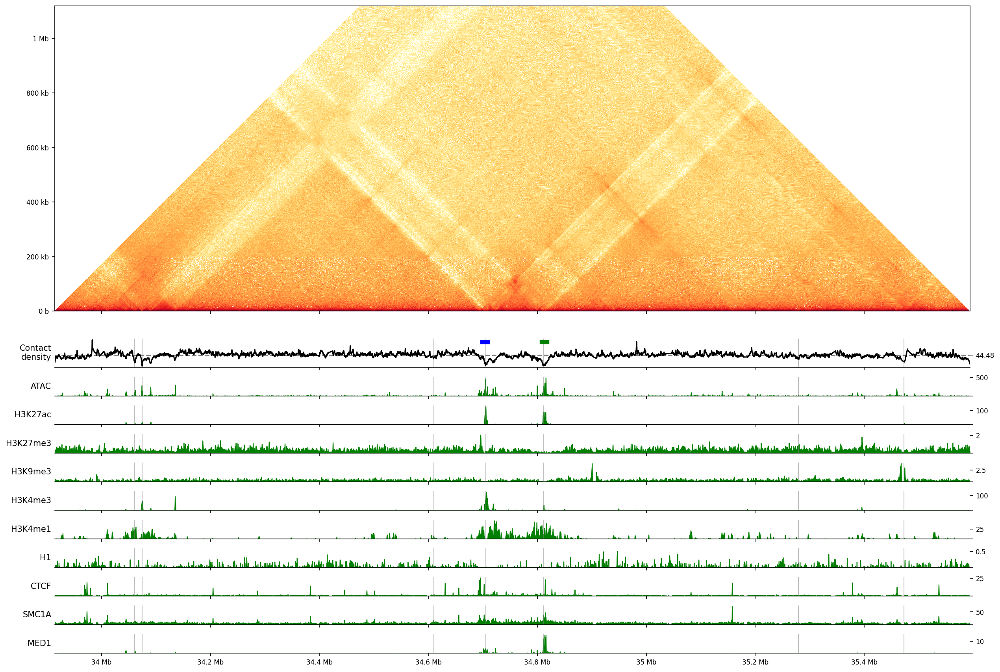

In [29]:
omics = '/home/joepaggi/orcd/pool/omics'
tracks = {
    #('MNase', f'{supercloud}/genomics_data/GSM1941475_MNase-seq_control_transfection_replicate_1_B00H5QE_7_1_C7BP7ACXX.IND119.mm39.bw'),
    #('H1', f'{supercloud}/genomics_data/GSM5770168_ChIP-seq_WT_H1.mm39.bw'),
    #('H1_v2', f'{supercloud}/genomics_data/GSM1124783_H1d-1_IP-IN.mm39.bw'),
    #'MNase': f'{supercloud}/mnase_data/SRR2919671/smooth.bw',
    #('NucleoATAC_signal', f'{supercloud}/atac/SRR5488974/nucleoatac_test.nucleoatac_signal.bw'),
   # ('NucleoATAC', f'{supercloud}/atac/SRR5488974/nucleoatac_test.occ.bw'),
    #('NucleoATAC_lower', f'{supercloud}/atac/SRR5488974/nucleoatac_test.occ.lower_bound.bw'),
    #('NucleoATAC_upper', f'{supercloud}/atac/SRR5488974/nucleoatac_test.occ.upper_bound.bw'),
    #'MNase-from-RCMC-smooth': f'{supercloud}/rcmc/nucleosomes_pe/all.nodups.shift73.bw',
    # 'ATAC': f'{supercloud}/genomics_data/GSE98390_E14_ATAC_MERGED.DANPOS.mm39.bw',
    # 'CTCF': f'{supercloud}/genomics_data/GSM2418860_WT_CTCF.mm39.bw',
    # 'SMC1A': f'{supercloud}/genomics_data/GSM3508477_C59_Smc1a_SpikeInNormalized.mm39.bw',
    # 'H3K4me1': f'{supercloud}/genomics_data/ENCFF282RLA.mm39.bw',
    # 'H3K4me3': f'{supercloud}/genomics_data/ENCFF523UIR.mm39.bw',
    # 'H3K27ac': f'{supercloud}/genomics_data/GSM2417096_ESC_H3K27ac.mm39.bw',
    # 'H3K27me3': f'{supercloud}/genomics_data/GSM2417100_ESC_H3K27me3.mm39.bw',
    # 'RING1B': f'{supercloud}/genomics_data/GSE96107_ES_Ring1B.mm39.bw',
    # 'MED1': f'{supercloud}/genomics_data/GSM560347_10022009_42TM0AAXX_B6.mm39.bw',
    
    'ATAC': f'{omics}/genomics_data/GSE98390_E14_ATAC_MERGED.DANPOS.mm39.bw',
    
    # These are all ENCODE signal-p data.
    'H3K27ac': f'{omics}/new_genomics_data/ENCFF230RNU.mm39.bw',
    'H3K27me3': f'{omics}/new_genomics_data/ENCFF160FEV.mm39.bw',
    'H3K9me3': f'{omics}/new_genomics_data/ENCFF293DGT.mm39.bw',
    'H3K4me3': f'{omics}/new_genomics_data/ENCFF523UIR.mm39.bw',
    'H3K4me1': f'{omics}/new_genomics_data/ENCFF410CGG.mm39.bw',
    
    'H1': f'{omics}/genomics_data/GSM1124783_H1d-1_IP-IN.mm39.bw',
    'CTCF': f'{omics}/genomics_data/GSM2418860_WT_CTCF.mm39.bw',
    'SMC1A': f'{omics}/genomics_data/GSM3508477_C59_Smc1a_SpikeInNormalized.mm39.bw',
    'MED1': f'{omics}/genomics_data/GSM560347_10022009_42TM0AAXX_B6.mm39.bw',
    # 'RING1B': f'{supercloud}/genomics_data/GSE96107_ES_Ring1B.mm39.bw',
}
# RefSeq annotations filtered to only include genes
# grep $'\tgene\t' mm39.gtf > mm39_gene.gtf
annotations = load_annotations(annotations=f'{supercloud}/ucsc/mm39_gene.gtf', alias=f'{supercloud}/ucsc/mm39.chromAlias.txt')
sox2 = annotations.loc[annotations.gene == 'Sox2']
sox2 = sox2.iloc[0]

scr = 34_813_000

f, axs, contact_map_ax = contact_map.epigenetics_plot(tracks, vmin=1e-4, show_map=True, depth=2/3*(end-start))
axs[0].plot([sox2.start-5_000, sox2.start+5_000], [70, 70], color='blue', lw=5)
axs[0].plot([scr-5_000, scr+5_000], [70, 70], color='green', lw=5)
plt.show()

[ 735  804 3479 3957 4488 6825 7793]


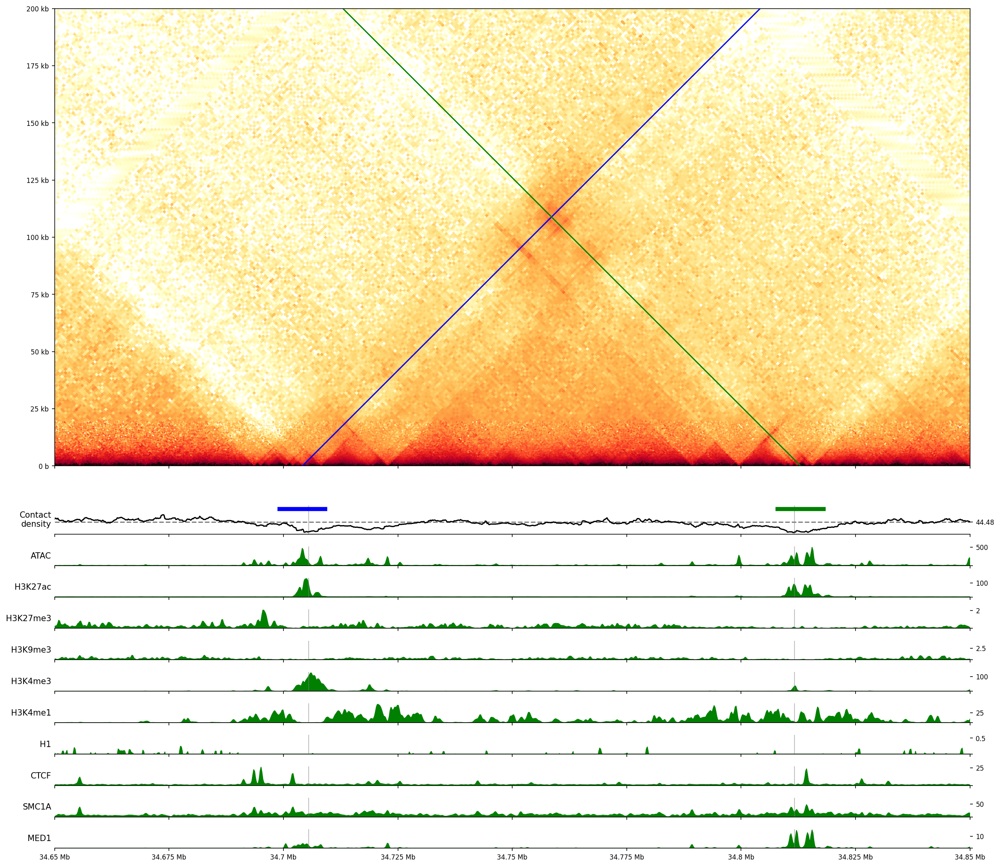

In [30]:
zoom = (34_650_000, 34_850_000)
# When planning to zoom, should set the depth in relation to the final aspect ratio.
# Here we want a full depth image in the end, so we set a full depth image to start.
f, axs, contact_map_ax = contact_map.epigenetics_plot(tracks, vmin=1e-3, show_map=True, depth=contact_map.end-contact_map.start)
contact_map_ax.set_ylim(0, zoom[1]-zoom[0])
axs[0].set_xlim(*zoom)
axs[0].plot([sox2.start-5_000, sox2.start+5_000], [70, 70], color='blue', lw=5)
axs[0].plot([scr-5_000, scr+5_000], [70, 70], color='green', lw=5)
contact_map_ax.plot([sox2.start, scr], [0, 2*(scr-sox2.start)], c='blue')
contact_map_ax.plot([sox2.start, scr], [2*(scr-sox2.start), 0], c='green')
plt.show()

In [31]:
(sox2.start - start) // 200 + 50, (scr - start) // 200 + 50

(np.int64(4000), 4545)